In [2]:
import pandas as pd
import matplotlib.pyplot as plt
import math
import seaborn as sns

import sys

Creating a function to check for missing values

In [3]:
def check_na(df, column):
    n = df.shape[0]
    num_of_na = df[column].isna().sum()
    frac_of_na = int(100.0*(num_of_na / n))
    print("# of NA values " + column + ": " + str(num_of_na) + ", " + str(frac_of_na) + "%")
    print(df[df[column].isna()].head())

Lipophilicity.csv was extracted from CHEMBL database and contains 4200 experimental logD values, all unique, calculated at pH=7.4

In [4]:
from google.colab import files
uploaded = files.upload()

Saving ADME.csv to ADME (2).csv


In [5]:
logd_data = pd.read_csv("ADME.csv", delimiter=",", low_memory=False)
logd_data.head()

,CMPD_CHEMBLID,exp,smiles
0,CHEMBL596271,3.54,Cn1c(CN2CCN(CC2)c3ccc(Cl)cc3)nc4ccccc14
1,CHEMBL1951080,-1.18,COc1cc(OC)c(cc1NC(=O)CSCC(=O)O)S(=O)(=O)N2C(C)...
2,CHEMBL1771,3.69,COC(=O)[C@@H](N1CCc2sccc2C1)c3ccccc3Cl
3,CHEMBL234951,3.37,OC[C@H](O)CN1C(=O)C(Cc2ccccc12)NC(=O)c3cc4cc(C...
4,CHEMBL565079,3.10,Cc1cccc(C[C@H](NC(=O)c2cc(nn2C)C(C)(C)C)C(=O)N...


In [6]:
logd_data = logd_data.drop(columns=["CMPD_CHEMBLID"])
logd_data = logd_data.rename(columns={"exp": "logD"})

In [7]:
logd_data.head()


,logD,smiles
0,3.54,Cn1c(CN2CCN(CC2)c3ccc(Cl)cc3)nc4ccccc14
1,-1.18,COc1cc(OC)c(cc1NC(=O)CSCC(=O)O)S(=O)(=O)N2C(C)...
2,3.69,COC(=O)[C@@H](N1CCc2sccc2C1)c3ccccc3Cl
3,3.37,OC[C@H](O)CN1C(=O)C(Cc2ccccc12)NC(=O)c3cc4cc(C...
4,3.10,Cc1cccc(C[C@H](NC(=O)c2cc(nn2C)C(C)(C)C)C(=O)N...


In [8]:
logd_data.shape


(4200, 2)

In [9]:
# all the experiments were held with pH=7.4
logd_data['pH'] = pd.Series([7.4 for i in range(4200)])

In [10]:
logd_data.head()

,logD,smiles,pH
0,3.54,Cn1c(CN2CCN(CC2)c3ccc(Cl)cc3)nc4ccccc14,7.4
1,-1.18,COc1cc(OC)c(cc1NC(=O)CSCC(=O)O)S(=O)(=O)N2C(C)...,7.4
2,3.69,COC(=O)[C@@H](N1CCc2sccc2C1)c3ccccc3Cl,7.4
3,3.37,OC[C@H](O)CN1C(=O)C(Cc2ccccc12)NC(=O)c3cc4cc(C...,7.4
4,3.10,Cc1cccc(C[C@H](NC(=O)c2cc(nn2C)C(C)(C)C)C(=O)N...,7.4


Checking for missing values

In [11]:
check_na(logd_data, 'logD')

# of NA values logD: 0, 0%
Empty DataFrame
Columns: [logD, smiles, pH]
Index: []


Hence, no missing values found in dataframe

In [12]:
#checking for duplicate values
logd_data.smiles.unique().shape

(4200,)

Hence verified that all values are unique

<ipython-input-13-6bdd8c11d90f>:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(logd_data.logD)


<Axes: xlabel='logD', ylabel='Density'>

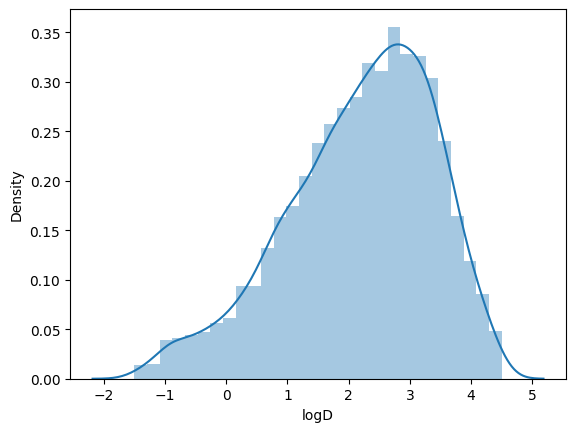

In [13]:
sns.distplot(logd_data.logD)

Hence the probaility density is highest for logD values between 2 to 3 and the complete set of values range from -2 to 5

In [14]:
import numpy as np
mean_logD = np.mean(logd_data.logD)
median_logD = np.median(logd_data.logD)
range_logD = np.ptp(logd_data.logD)
iqr_logD = np.percentile(logd_data.logD, 75) - np.percentile(logd_data.logD, 25)
std_logD = np.std(logd_data.logD)
skew_logD = logd_data.logD.skew()
kurt_logD = logd_data.logD.kurtosis()

# Print the summary statistics
print(f"Mean: {mean_logD}")
print(f"Median: {median_logD}")
print(f"Range: {range_logD}")
print(f"IQR: {iqr_logD}")
print(f"Standard Deviation: {std_logD}")
print(f"Skewness: {skew_logD}")
print(f"Kurtosis: {kurt_logD}")

Mean: 2.1863357142857143
Median: 2.36
Range: 6.0
IQR: 1.6900000000000002
Standard Deviation: 1.2028604901336188
Skewness: -0.5822183436660706
Kurtosis: -0.11392697443747091


Thus we can coclude that
1. On average, the 'logD' values are around 2.19.
2. Most of the 'logD' values are clustered within a relatively small range.
3.  The distribution of 'logD' values is slightly tilted to the right, meaning there are some values on the higher side that are pulling the average in that direction
4. The 'logD' values don't have extremely long tails, indicating that there are no extremely high or low values that are far from the average.

so, 'logD' values are mostly centered around an average value, with a few higher values pulling that average a bit to the right. The majority of values are close together, and there are no extreme values that significantly deviate from the norm.

In [15]:
#storing the post processed data in a new csv file
logd_data.to_csv("logd_ADME_dataset.csv")

In [16]:
#checking for bad SMILES
bad_smiles = ['O=[Ti]=O.O=[Ti]=O', 'CC(=O)OC1=C(C=CC=C1)C(O)=O', 'CC1=CC=C(C)C(OCCCC(C)(C)C(O)=O)=C1',
              'CCC1(C(=O)NC(=O)NC1=O)C1=CC=CC=C1', '[H]OC(=O)C([H])(N([H])[H])C([H])([H])C([H])(C([H])([H])[H])C([H])([H])[H]']

In [17]:
logd_data.smiles.isin(bad_smiles)

0       False
1       False
2       False
3       False
4       False
        ...  
4195    False
4196    False
4197    False
4198    False
4199    False
Name: smiles, Length: 4200, dtype: bool

In [18]:
 logd_data[logd_data.smiles.isin(bad_smiles)]

,logD,smiles,pH


Hence no bad SMILES found in the dataset

In [19]:
logd_data.describe()

,logD,pH
count,4200.000000,4.200000e+03
mean,2.186336,7.400000e+00
std,1.203004,8.882842e-16
min,-1.500000,7.400000e+00
25%,1.410000,7.400000e+00
50%,2.360000,7.400000e+00
75%,3.100000,7.400000e+00
max,4.500000,7.400000e+00


In [20]:
pip install rdkit

In [21]:
from rdkit import Chem, DataStructs

In [22]:
from scipy import stats
from rdkit.Chem import AllChem
from pathlib import Path

In [23]:
logd_data


,logD,smiles,pH
0,3.54,Cn1c(CN2CCN(CC2)c3ccc(Cl)cc3)nc4ccccc14,7.4
1,-1.18,COc1cc(OC)c(cc1NC(=O)CSCC(=O)O)S(=O)(=O)N2C(C)...,7.4
2,3.69,COC(=O)[C@@H](N1CCc2sccc2C1)c3ccccc3Cl,7.4
3,3.37,OC[C@H](O)CN1C(=O)C(Cc2ccccc12)NC(=O)c3cc4cc(C...,7.4
4,3.10,Cc1cccc(C[C@H](NC(=O)c2cc(nn2C)C(C)(C)C)C(=O)N...,7.4
...,...,...,...
4195,3.85,OCCc1ccc(NC(=O)c2cc3cc(Cl)ccc3[nH]2)cc1,7.4
4196,3.21,CCN(C1CCN(CCC(c2ccc(F)cc2)c3ccc(F)cc3)CC1)C(=O...,7.4
4197,2.10,COc1cccc2[nH]ncc12,7.4
4198,2.65,Clc1ccc2ncccc2c1C(=O)NCC3CCCCC3,7.4


Creating a list of rdkit molecule objects corresponding to each smile notation in the dataframe

In [24]:
mols = [Chem.MolFromSmiles(s) for s in logd_data.smiles]

Creating a list of pandas series where each series corresponds to a different molecule and which contains the count of atoms for each unique canonical rank in that molecule.

Canonical rank is important for consistent representation of molecular structure and it depends on:
1. Connectivity
2. Hydrogen Suppression
3. Isotopes
4. Tautomerism

In [25]:
values_list = [pd.Series(Chem.CanonicalRankAtoms(mol, breakTies=False)).value_counts() for mol in mols]

Finding list of symmetric values: true/false list

In [26]:
symmetry_list = [(len(values) - 1 <= len(values[values % 2 == 0])) or (len(values) - 1 <= len(values[(values % 2 == 1) & (values > 1)])) for values in values_list]

In [27]:
# creating a list of symmetrical and unsymmetrical molecular structures
symmetry_data = logd_data[symmetry_list]
not_symmetry_data = logd_data[[not e for e in symmetry_list]]

In [28]:
symmetry_data

,logD,smiles,pH
27,2.27,C(CCCCNc1cc(nc2ccccc12)c3ccccc3)CCCNc4cc(nc5cc...,7.4
336,0.73,C(CNCc1ccccc1)NCc2ccccc2,7.4
364,3.48,C[C@@H](CNC(=O)c1c(O)c(O)cc2c(O)c(c(C)cc12)c3c...,7.4
382,4.20,c1ccc(cc1)c2nnc(s2)c3ccccc3,7.4
550,0.53,Cc1cc(N)c2cc(NC(=O)CCCCC(=O)Nc3ccc4nc(C)cc(N)c...,7.4
610,3.38,COc1ccc(C=NN=Cc2ccc(OC)c(OC)c2)cc1OC,7.4
830,1.39,Cc1cc(N)c2cc(NC(=O)CCC(=O)Nc3ccc4nc(C)cc(N)c4c...,7.4
903,2.60,O=C1C(=O)c2ccccc2c3ccccc13,7.4
978,1.80,COc1cc(ccc1Nc2ccccc2C(=O)O)c3ccc(Nc4ccccc4C(=O...,7.4
993,3.20,N(c1ccccc1)c2ccccc2,7.4


In [29]:
symmetry_data.shape

(35, 3)

Hence there are 35 symmetrical molecules out of 4200. Hence the conclusion from the following research can only be generalised for unsymmetrical molecules. We need a larger dataset to make any claims about symmetrical molecules

In [30]:
not_symmetry_data.shape

(4165, 3)

Reindexing the non symmetric data frame

In [31]:
not_symmetry_data=not_symmetry_data.reset_index(drop=True)

In [32]:
not_symmetry_data.head()

,logD,smiles,pH
0,3.54,Cn1c(CN2CCN(CC2)c3ccc(Cl)cc3)nc4ccccc14,7.4
1,-1.18,COc1cc(OC)c(cc1NC(=O)CSCC(=O)O)S(=O)(=O)N2C(C)...,7.4
2,3.69,COC(=O)[C@@H](N1CCc2sccc2C1)c3ccccc3Cl,7.4
3,3.37,OC[C@H](O)CN1C(=O)C(Cc2ccccc12)NC(=O)c3cc4cc(C...,7.4
4,3.10,Cc1cccc(C[C@H](NC(=O)c2cc(nn2C)C(C)(C)C)C(=O)N...,7.4


C(CCCCNc1cc(nc2ccccc12)c3ccccc3)CCCNc4cc(nc5ccccc45)c6ccccc6
[20, 20, 22, 24, 26, 30, 36, 14, 34, 28, 38, 16, 6, 8, 18, 40, 32, 10, 2, 0, 2, 10, 22, 24, 26, 30, 36, 14, 34, 28, 38, 16, 6, 8, 18, 40, 32, 10, 2, 0, 2, 10]


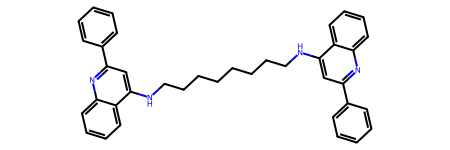

C(CNCc1ccccc1)NCc2ccccc2
[10, 10, 14, 12, 16, 6, 2, 0, 2, 6, 14, 12, 16, 6, 2, 0, 2, 6]


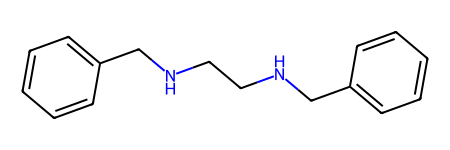

C[C@@H](CNC(=O)c1c(O)c(O)cc2c(O)c(c(C)cc12)c3c(C)cc4c(C(=O)NC[C@H](C)c5ccccc5)c(O)c(O)cc4c3O)c6ccccc6
[2, 50, 26, 28, 30, 4, 44, 38, 8, 36, 6, 22, 46, 42, 10, 40, 34, 0, 24, 48, 40, 34, 0, 24, 48, 44, 30, 4, 28, 26, 50, 2, 32, 18, 14, 12, 14, 18, 38, 8, 36, 6, 22, 46, 42, 10, 32, 18, 14, 12, 14, 18]


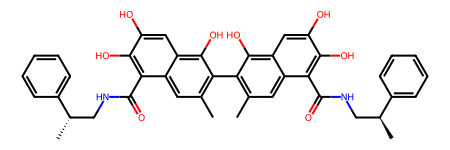

c1ccc(cc1)c2nnc(s2)c3ccccc3
[0, 2, 6, 13, 6, 2, 15, 10, 10, 15, 12, 13, 6, 2, 0, 2, 6]


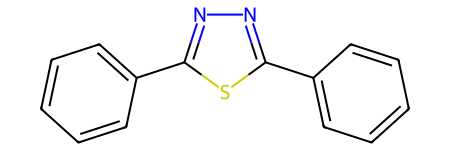

Cc1cc(N)c2cc(NC(=O)CCCCC(=O)Nc3ccc4nc(C)cc(N)c4c3)ccc2n1
[0, 26, 8, 28, 2, 32, 12, 24, 20, 22, 4, 16, 14, 14, 16, 22, 4, 20, 24, 6, 10, 30, 18, 26, 0, 8, 28, 2, 32, 12, 6, 10, 30, 18]


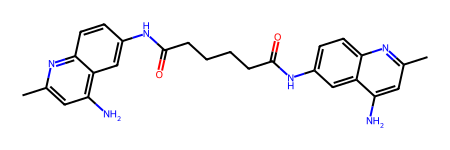

In [33]:
count = 0
for smiles in symmetry_data.smiles:
    mol = Chem.MolFromSmiles(smiles)
    print(smiles)
    print(list(Chem.CanonicalRankAtoms(mol, breakTies=False)))
    display(mol)
    count += 1
    if count == 5:
        break


Cn1c(CN2CCN(CC2)c3ccc(Cl)cc3)nc4ccccc14
[0, 23, 18, 12, 21, 10, 13, 22, 13, 10, 17, 6, 4, 16, 1, 4, 6, 15, 19, 8, 2, 3, 9, 20]


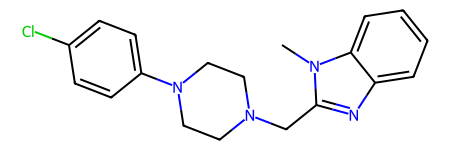

COc1cc(OC)c(cc1NC(=O)CSCC(=O)O)S(=O)(=O)N2C(C)CCc3ccccc23
[0, 19, 26, 11, 27, 20, 1, 29, 13, 25, 18, 23, 4, 15, 21, 14, 22, 3, 7, 32, 5, 5, 31, 30, 2, 17, 16, 24, 10, 8, 9, 12, 28]


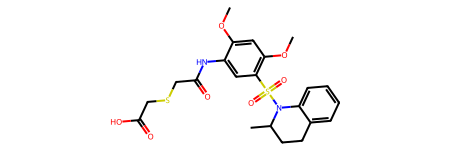

COC(=O)[C@@H](N1CCc2sccc2C1)c3ccccc3Cl
[0, 12, 14, 1, 19, 20, 10, 9, 18, 13, 5, 7, 16, 11, 17, 8, 4, 3, 6, 15, 2]


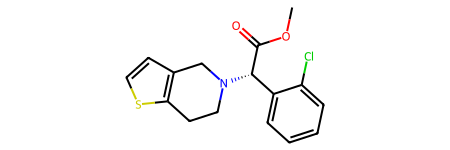

OC[C@H](O)CN1C(=O)C(Cc2ccccc12)NC(=O)c3cc4cc(Cl)sc4[nH]3
[2, 12, 26, 3, 13, 27, 18, 1, 25, 11, 21, 7, 5, 6, 8, 22, 14, 17, 0, 19, 9, 23, 10, 20, 4, 16, 24, 15]


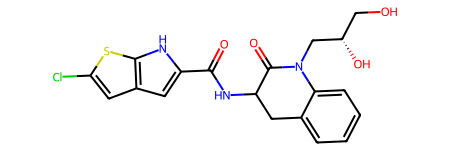

Cc1cccc(C[C@H](NC(=O)c2cc(nn2C)C(C)(C)C)C(=O)NCC#N)c1
[0, 21, 10, 9, 11, 22, 15, 25, 18, 19, 6, 24, 13, 23, 16, 26, 1, 27, 2, 2, 2, 20, 7, 17, 14, 8, 5, 12]


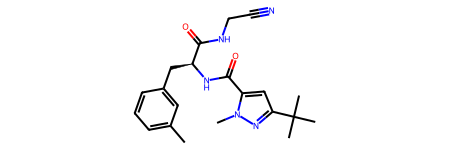

In [34]:
count =0;
for smiles in not_symmetry_data.smiles:
    mol = Chem.MolFromSmiles(smiles)
    print(smiles)
    print(list(Chem.CanonicalRankAtoms(mol, breakTies=False)))
    display(mol)
    count += 1
    if count == 5:
        break

Printing the canonical rank of each atom in SMILE molecules and dispalying the molecule structure for visual inspection

<ipython-input-35-064c8f711d68>:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(symmetry_data.logD)


<Axes: xlabel='logD', ylabel='Density'>

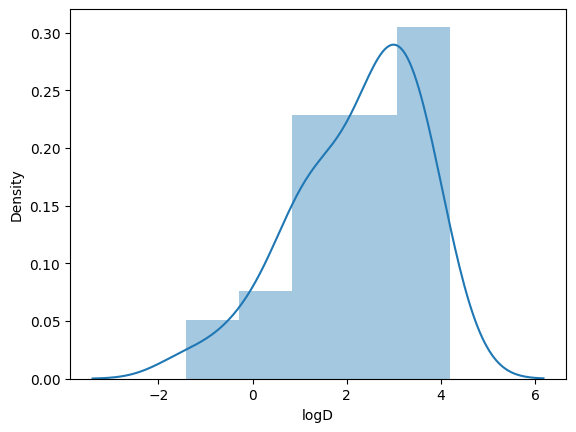

In [35]:
sns.distplot(symmetry_data.logD)

<ipython-input-36-9c79267fea9b>:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(not_symmetry_data.logD)


<Axes: xlabel='logD', ylabel='Density'>

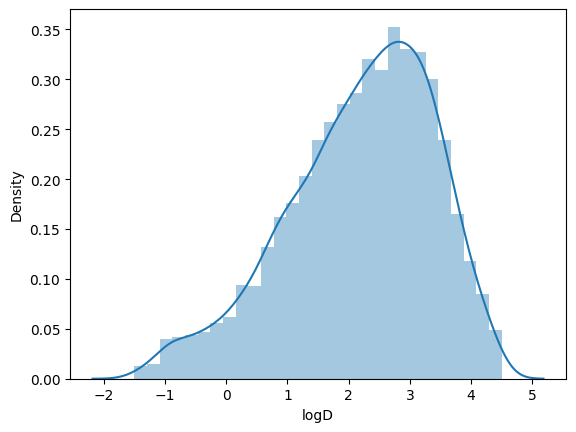

In [36]:
sns.distplot(not_symmetry_data.logD)

In [37]:
mean_logD = np.mean(not_symmetry_data.logD)
median_logD = np.median(not_symmetry_data.logD)
range_logD = np.ptp(not_symmetry_data.logD)
iqr_logD = np.percentile(not_symmetry_data.logD, 75) - np.percentile(not_symmetry_data.logD, 25)
std_logD = np.std(not_symmetry_data.logD)
skew_logD = not_symmetry_data.logD.skew()
kurt_logD = not_symmetry_data.logD.kurtosis()

# Print the summary statistics
print(f"Mean: {mean_logD}")
print(f"Median: {median_logD}")
print(f"Range: {range_logD}")
print(f"IQR: {iqr_logD}")
print(f"Standard Deviation: {std_logD}")
print(f"Skewness: {skew_logD}")
print(f"Kurtosis: {kurt_logD}")

Mean: 2.185995198079232
Median: 2.36
Range: 6.0
IQR: 1.6900000000000002
Standard Deviation: 1.2017946763713894
Skewness: -0.5802116761717673
Kurtosis: -0.11619111790301062


After removing symmetric molecules, which often exhibit similar patterns in their chemical structures, our logD values didn't change significantly. The average value, the spread of values, and the overall shape of the distribution remained quite similar. This suggests that the presence or absence of symmetry in the molecules didn't have a drastic impact on their logD values. The substances in our dataset still exhibit comparable hydrophilic and lipophilic properties, providing consistency in their behavior across different structural arrangements

In [38]:
stats.ttest_ind(not_symmetry_data.logD,symmetry_data.logD)

TtestResult(statistic=-0.20008719463033, pvalue=0.8414220797277454, df=4198.0)

Null Hypothesis (H0): There is no significant difference in logD values between molecules with symmetry and molecules without symmetry.

Alternative Hypothesis (H1): There is a significant difference in logD values between the two groups.

T-statistic: -0.2001

P-value: 0.8414

The p-value of 0.8414 is greater than the common significance level of 0.05. Since the p-value is greater than 0.05, we fail to reject the null hypothesis. Therefore, based on this test, there is insufficient statistical evidence to conclude that there is a significant difference in logD values between molecules with symmetry and molecules without symmetry.

Hence, the logD values of the two groups are statistically similar, and any observed differences are likely due to random variability rather than a meaningful difference between the groups.

In [39]:
# Adding the rdkit mol objects to dataframe for each moelcule

not_symmetry_data['mol'] = not_symmetry_data['smiles'].apply(lambda x: Chem.MolFromSmiles(x))

not_symmetry_data.head()

,logD,smiles,pH,mol
0,3.54,Cn1c(CN2CCN(CC2)c3ccc(Cl)cc3)nc4ccccc14,7.4,<rdkit.Chem.rdchem.Mol object at 0x7e24501f2f10>
1,-1.18,COc1cc(OC)c(cc1NC(=O)CSCC(=O)O)S(=O)(=O)N2C(C)...,7.4,<rdkit.Chem.rdchem.Mol object at 0x7e24501f2f80>
2,3.69,COC(=O)[C@@H](N1CCc2sccc2C1)c3ccccc3Cl,7.4,<rdkit.Chem.rdchem.Mol object at 0x7e24501f2ff0>
3,3.37,OC[C@H](O)CN1C(=O)C(Cc2ccccc12)NC(=O)c3cc4cc(C...,7.4,<rdkit.Chem.rdchem.Mol object at 0x7e24501f3060>
4,3.10,Cc1cccc(C[C@H](NC(=O)c2cc(nn2C)C(C)(C)C)C(=O)N...,7.4,<rdkit.Chem.rdchem.Mol object at 0x7e24501f30d0>


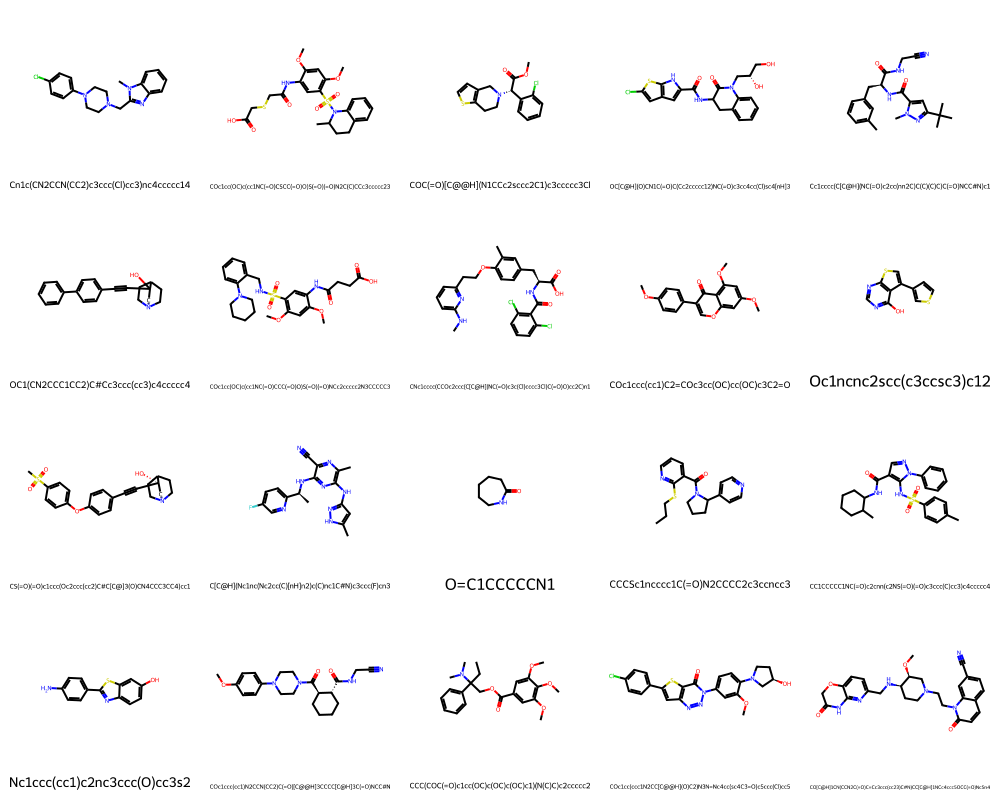

In [40]:
from rdkit.Chem import Draw

number_to_print = 20
mols = not_symmetry_data['mol'][:number_to_print]

#MolsToGridImage allows to show several molecules in a grid
Draw.MolsToGridImage(mols, molsPerRow=5, useSVG=True, legends=list(not_symmetry_data['smiles'][:number_to_print].values))

Visulaing the static image of first 20 non symmetric molecules for a bird eye view of structural data

We can use RD-Kit's built in functions to create new features for our model. For example, we can add columns for the number of total atoms in the molecule and the number Chloride (Cl) atoms in the molecule. These features might be important in predicting logP.


In [41]:
# AddHs function adds H atoms to a MOL (as Hs in SMILES are usualy ignored)
not_symmetry_data['mol'] = not_symmetry_data['mol'].apply(lambda x: Chem.AddHs(x))

The first function we use is Chem.AddHs. Typically, the SMILES format does not explicitly show the Hydrogen atoms (H). They are implied. It actually helps us a bit in our model accuracy to specifically add these back.

In [42]:
not_symmetry_data.head()

,logD,smiles,pH,mol
0,3.54,Cn1c(CN2CCN(CC2)c3ccc(Cl)cc3)nc4ccccc14,7.4,<rdkit.Chem.rdchem.Mol object at 0x7e244d315460>
1,-1.18,COc1cc(OC)c(cc1NC(=O)CSCC(=O)O)S(=O)(=O)N2C(C)...,7.4,<rdkit.Chem.rdchem.Mol object at 0x7e244d3154d0>
2,3.69,COC(=O)[C@@H](N1CCc2sccc2C1)c3ccccc3Cl,7.4,<rdkit.Chem.rdchem.Mol object at 0x7e244d315540>
3,3.37,OC[C@H](O)CN1C(=O)C(Cc2ccccc12)NC(=O)c3cc4cc(C...,7.4,<rdkit.Chem.rdchem.Mol object at 0x7e244d3155b0>
4,3.10,Cc1cccc(C[C@H](NC(=O)c2cc(nn2C)C(C)(C)C)C(=O)N...,7.4,<rdkit.Chem.rdchem.Mol object at 0x7e244d315620>


Heavier atoms generally contribute more to molecular weight and can affect the overall size and mass of the molecule. This can influence its interaction with the solvent phases and affect logD

In [43]:
# GetNumAtoms() method returns a general nubmer of all atoms in a molecule
not_symmetry_data['num_of_atoms'] = not_symmetry_data['mol'].apply(lambda x: x.GetNumAtoms())

# GetNumHeavyAtoms() method returns a nubmer of all atoms in a molecule with molecular weight > 1
not_symmetry_data['num_of_heavy_atoms'] = not_symmetry_data['mol'].apply(lambda x: x.GetNumHeavyAtoms())

In [44]:
#We're going to searches patterns and use it for a list of most common atoms only
def number_of_atoms(atom_list, df):
    for i in atom_list:
        not_symmetry_data['num_of_{}_atoms'.format(i)] = not_symmetry_data['mol'].apply(lambda x: len(x.GetSubstructMatches(Chem.MolFromSmiles(i))))

number_of_atoms(['C', 'O', 'N', 'Cl', 'P', 'Br', 'F'], not_symmetry_data)

Now, we calculate and adding molecular descriptors related to polar surface area, molecular weight, number of valence electrons, and number of heteroatoms to a DataFrame.

In [45]:
from rdkit.Chem import Descriptors
not_symmetry_data['tpsa'] =  not_symmetry_data['mol'].apply(lambda x: Descriptors.TPSA(x))
not_symmetry_data['mol_w'] =  not_symmetry_data['mol'].apply(lambda x: Descriptors.ExactMolWt(x))
not_symmetry_data['num_valence_electrons'] =  not_symmetry_data['mol'].apply(lambda x: Descriptors.NumValenceElectrons(x))
not_symmetry_data['num_heteroatoms'] =  not_symmetry_data['mol'].apply(lambda x: Descriptors.NumHeteroatoms(x))

Total polar Surface Area: TPSA is a measure of the polar surface area of a molecule. Compounds with higher TPSA values tend to be more hydrophilic. TPSA can provide insight into the molecule's ability to form hydrogen bonds, impacting logD.

Molecular Weight: Molecular weight affects the overall size and mass of the molecule. Larger molecules may have different solubility and permeability characteristics, which can influence logD.

Valence Electrons: The number of valence electrons is related to the electronic properties of a molecule. It can influence its ability to form polar or nonpolar interactions with the solvent, affecting logD.

In [46]:
not_symmetry_data.head()

,logD,smiles,pH,mol,num_of_atoms,num_of_heavy_atoms,num_of_C_atoms,num_of_O_atoms,num_of_N_atoms,num_of_Cl_atoms,num_of_P_atoms,num_of_Br_atoms,num_of_F_atoms,tpsa,mol_w,num_valence_electrons,num_heteroatoms
0,3.54,Cn1c(CN2CCN(CC2)c3ccc(Cl)cc3)nc4ccccc14,7.4,<rdkit.Chem.rdchem.Mol object at 0x7e244d315460>,45,24,19,0,4,1,0,0,0,24.30,340.145474,124,5
1,-1.18,COc1cc(OC)c(cc1NC(=O)CSCC(=O)O)S(=O)(=O)N2C(C)...,7.4,<rdkit.Chem.rdchem.Mol object at 0x7e244d3154d0>,59,33,22,7,2,0,0,0,0,122.24,494.118143,178,11
2,3.69,COC(=O)[C@@H](N1CCc2sccc2C1)c3ccccc3Cl,7.4,<rdkit.Chem.rdchem.Mol object at 0x7e244d315540>,37,21,16,2,1,1,0,0,0,29.54,321.059027,110,5
3,3.37,OC[C@H](O)CN1C(=O)C(Cc2ccccc12)NC(=O)c3cc4cc(C...,7.4,<rdkit.Chem.rdchem.Mol object at 0x7e244d3155b0>,46,28,19,4,3,1,0,0,0,105.66,419.070655,146,9
4,3.10,Cc1cccc(C[C@H](NC(=O)c2cc(nn2C)C(C)(C)C)C(=O)N...,7.4,<rdkit.Chem.rdchem.Mol object at 0x7e244d315620>,55,28,21,2,5,0,0,0,0,99.81,381.216475,148,7


In [47]:
(not_symmetry_data['num_of_Br_atoms'] == 0).all()

False

In [48]:
(not_symmetry_data['num_of_F_atoms'] == 0).sum()

3264

Since not all values of these columns are 0 we dont need to remove them

In [49]:
not_symmetry_data = not_symmetry_data.rename(columns={'num_of_C_atoms': 'C_atoms','num_of_O_atoms': 'O_atoms','num_of_Cl_atoms': 'Cl_atoms','num_of_P_atoms': 'P_atoms','num_of_Br_atoms': 'Br_atoms','num_of_F_atoms': 'F_atoms'})

In [50]:
not_symmetry_data.head()

,logD,smiles,pH,mol,num_of_atoms,num_of_heavy_atoms,C_atoms,O_atoms,num_of_N_atoms,Cl_atoms,P_atoms,Br_atoms,F_atoms,tpsa,mol_w,num_valence_electrons,num_heteroatoms
0,3.54,Cn1c(CN2CCN(CC2)c3ccc(Cl)cc3)nc4ccccc14,7.4,<rdkit.Chem.rdchem.Mol object at 0x7e244d315460>,45,24,19,0,4,1,0,0,0,24.30,340.145474,124,5
1,-1.18,COc1cc(OC)c(cc1NC(=O)CSCC(=O)O)S(=O)(=O)N2C(C)...,7.4,<rdkit.Chem.rdchem.Mol object at 0x7e244d3154d0>,59,33,22,7,2,0,0,0,0,122.24,494.118143,178,11
2,3.69,COC(=O)[C@@H](N1CCc2sccc2C1)c3ccccc3Cl,7.4,<rdkit.Chem.rdchem.Mol object at 0x7e244d315540>,37,21,16,2,1,1,0,0,0,29.54,321.059027,110,5
3,3.37,OC[C@H](O)CN1C(=O)C(Cc2ccccc12)NC(=O)c3cc4cc(C...,7.4,<rdkit.Chem.rdchem.Mol object at 0x7e244d3155b0>,46,28,19,4,3,1,0,0,0,105.66,419.070655,146,9
4,3.10,Cc1cccc(C[C@H](NC(=O)c2cc(nn2C)C(C)(C)C)C(=O)N...,7.4,<rdkit.Chem.rdchem.Mol object at 0x7e244d315620>,55,28,21,2,5,0,0,0,0,99.81,381.216475,148,7


In [51]:
not_symmetry_data = not_symmetry_data.rename(columns={'num_of_atoms':'Atoms','num_of_heavy_atoms':'Heavy_Atoms','num_valence_electrons': 'Valence_e','num_heteroatoms':'Heteroatoms'})

In [52]:
not_symmetry_data.head()

,logD,smiles,pH,mol,Atoms,Heavy_Atoms,C_atoms,O_atoms,num_of_N_atoms,Cl_atoms,P_atoms,Br_atoms,F_atoms,tpsa,mol_w,Valence_e,Heteroatoms
0,3.54,Cn1c(CN2CCN(CC2)c3ccc(Cl)cc3)nc4ccccc14,7.4,<rdkit.Chem.rdchem.Mol object at 0x7e244d315460>,45,24,19,0,4,1,0,0,0,24.30,340.145474,124,5
1,-1.18,COc1cc(OC)c(cc1NC(=O)CSCC(=O)O)S(=O)(=O)N2C(C)...,7.4,<rdkit.Chem.rdchem.Mol object at 0x7e244d3154d0>,59,33,22,7,2,0,0,0,0,122.24,494.118143,178,11
2,3.69,COC(=O)[C@@H](N1CCc2sccc2C1)c3ccccc3Cl,7.4,<rdkit.Chem.rdchem.Mol object at 0x7e244d315540>,37,21,16,2,1,1,0,0,0,29.54,321.059027,110,5
3,3.37,OC[C@H](O)CN1C(=O)C(Cc2ccccc12)NC(=O)c3cc4cc(C...,7.4,<rdkit.Chem.rdchem.Mol object at 0x7e244d3155b0>,46,28,19,4,3,1,0,0,0,105.66,419.070655,146,9
4,3.10,Cc1cccc(C[C@H](NC(=O)c2cc(nn2C)C(C)(C)C)C(=O)N...,7.4,<rdkit.Chem.rdchem.Mol object at 0x7e244d315620>,55,28,21,2,5,0,0,0,0,99.81,381.216475,148,7


In [53]:
not_symmetry_data.to_csv("logd_ADME_nonsym_dataset.csv")

Aromatic compounds tend to be more hydrophobic. An increase in the aromatic proportion may contribute to an increase in the hydrophobicity of the molecule, affecting its logD

In [54]:
#Aromatic Proportion
not_symmetry_data['Aromatic_Proportion'] = not_symmetry_data['mol'].apply(
    lambda mol: sum(atom.GetIsAromatic() for atom in mol.GetAtoms()) / mol.GetNumAtoms() if mol else 0
)

In [55]:
not_symmetry_data.head()

,logD,smiles,pH,mol,Atoms,Heavy_Atoms,C_atoms,O_atoms,num_of_N_atoms,Cl_atoms,P_atoms,Br_atoms,F_atoms,tpsa,mol_w,Valence_e,Heteroatoms,Aromatic_Proportion
0,3.54,Cn1c(CN2CCN(CC2)c3ccc(Cl)cc3)nc4ccccc14,7.4,<rdkit.Chem.rdchem.Mol object at 0x7e244d315460>,45,24,19,0,4,1,0,0,0,24.30,340.145474,124,5,0.333333
1,-1.18,COc1cc(OC)c(cc1NC(=O)CSCC(=O)O)S(=O)(=O)N2C(C)...,7.4,<rdkit.Chem.rdchem.Mol object at 0x7e244d3154d0>,59,33,22,7,2,0,0,0,0,122.24,494.118143,178,11,0.203390
2,3.69,COC(=O)[C@@H](N1CCc2sccc2C1)c3ccccc3Cl,7.4,<rdkit.Chem.rdchem.Mol object at 0x7e244d315540>,37,21,16,2,1,1,0,0,0,29.54,321.059027,110,5,0.297297
3,3.37,OC[C@H](O)CN1C(=O)C(Cc2ccccc12)NC(=O)c3cc4cc(C...,7.4,<rdkit.Chem.rdchem.Mol object at 0x7e244d3155b0>,46,28,19,4,3,1,0,0,0,105.66,419.070655,146,9,0.304348
4,3.10,Cc1cccc(C[C@H](NC(=O)c2cc(nn2C)C(C)(C)C)C(=O)N...,7.4,<rdkit.Chem.rdchem.Mol object at 0x7e244d315620>,55,28,21,2,5,0,0,0,0,99.81,381.216475,148,7,0.200000


Compounds with a higher number of rotatable bonds may have increased flexibility. This flexibility can influence the ability of a molecule to adopt a favorable conformation in a hydrophobic environment, impacting its logD

In [56]:
# Number of rotatable bonds
not_symmetry_data['RB'] = not_symmetry_data['mol'].apply(
    lambda mol: Descriptors.NumRotatableBonds(mol) if mol else None
)

In [57]:
not_symmetry_data.head()

,logD,smiles,pH,mol,Atoms,Heavy_Atoms,C_atoms,O_atoms,num_of_N_atoms,Cl_atoms,P_atoms,Br_atoms,F_atoms,tpsa,mol_w,Valence_e,Heteroatoms,Aromatic_Proportion,RB
0,3.54,Cn1c(CN2CCN(CC2)c3ccc(Cl)cc3)nc4ccccc14,7.4,<rdkit.Chem.rdchem.Mol object at 0x7e244d315460>,45,24,19,0,4,1,0,0,0,24.30,340.145474,124,5,0.333333,4
1,-1.18,COc1cc(OC)c(cc1NC(=O)CSCC(=O)O)S(=O)(=O)N2C(C)...,7.4,<rdkit.Chem.rdchem.Mol object at 0x7e244d3154d0>,59,33,22,7,2,0,0,0,0,122.24,494.118143,178,11,0.203390,12
2,3.69,COC(=O)[C@@H](N1CCc2sccc2C1)c3ccccc3Cl,7.4,<rdkit.Chem.rdchem.Mol object at 0x7e244d315540>,37,21,16,2,1,1,0,0,0,29.54,321.059027,110,5,0.297297,4
3,3.37,OC[C@H](O)CN1C(=O)C(Cc2ccccc12)NC(=O)c3cc4cc(C...,7.4,<rdkit.Chem.rdchem.Mol object at 0x7e244d3155b0>,46,28,19,4,3,1,0,0,0,105.66,419.070655,146,9,0.304348,7
4,3.10,Cc1cccc(C[C@H](NC(=O)c2cc(nn2C)C(C)(C)C)C(=O)N...,7.4,<rdkit.Chem.rdchem.Mol object at 0x7e244d315620>,55,28,21,2,5,0,0,0,0,99.81,381.216475,148,7,0.200000,8


In [58]:
#shifting logD to last column position
column_to_shift='logD'
column_order = list(not_symmetry_data.columns)
column_order.remove(column_to_shift)
column_order.append(column_to_shift)
not_symmetry_data = not_symmetry_data[column_order]
not_symmetry_data.head()

,smiles,pH,mol,Atoms,Heavy_Atoms,C_atoms,O_atoms,num_of_N_atoms,Cl_atoms,P_atoms,Br_atoms,F_atoms,tpsa,mol_w,Valence_e,Heteroatoms,Aromatic_Proportion,RB,logD
0,Cn1c(CN2CCN(CC2)c3ccc(Cl)cc3)nc4ccccc14,7.4,<rdkit.Chem.rdchem.Mol object at 0x7e244d315460>,45,24,19,0,4,1,0,0,0,24.30,340.145474,124,5,0.333333,4,3.54
1,COc1cc(OC)c(cc1NC(=O)CSCC(=O)O)S(=O)(=O)N2C(C)...,7.4,<rdkit.Chem.rdchem.Mol object at 0x7e244d3154d0>,59,33,22,7,2,0,0,0,0,122.24,494.118143,178,11,0.203390,12,-1.18
2,COC(=O)[C@@H](N1CCc2sccc2C1)c3ccccc3Cl,7.4,<rdkit.Chem.rdchem.Mol object at 0x7e244d315540>,37,21,16,2,1,1,0,0,0,29.54,321.059027,110,5,0.297297,4,3.69
3,OC[C@H](O)CN1C(=O)C(Cc2ccccc12)NC(=O)c3cc4cc(C...,7.4,<rdkit.Chem.rdchem.Mol object at 0x7e244d3155b0>,46,28,19,4,3,1,0,0,0,105.66,419.070655,146,9,0.304348,7,3.37
4,Cc1cccc(C[C@H](NC(=O)c2cc(nn2C)C(C)(C)C)C(=O)N...,7.4,<rdkit.Chem.rdchem.Mol object at 0x7e244d315620>,55,28,21,2,5,0,0,0,0,99.81,381.216475,148,7,0.200000,8,3.10


In [59]:
not_symmetry_data.to_csv("logd_ADME_final.csv")

In [60]:
from sklearn.model_selection import train_test_split
X = not_symmetry_data.drop('logD', axis=1)
y = not_symmetry_data['logD']
# Splitting the data into training (70%) and testing (30%)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

In [61]:
print("X_train shape:", X_train.shape)
print("X_test shape:", X_test.shape)
print("y_train shape:", y_train.shape)
print("y_test shape:", y_test.shape)

X_train shape: (2915, 18)
X_test shape: (1250, 18)
y_train shape: (2915,)
y_test shape: (1250,)


In [62]:
X_train=X_train.drop('smiles',axis=1)
X_train=X_train.drop('pH',axis=1)
X_train=X_train.drop('mol',axis=1)

In [63]:
X_train

,Atoms,Heavy_Atoms,C_atoms,O_atoms,num_of_N_atoms,Cl_atoms,P_atoms,Br_atoms,F_atoms,tpsa,mol_w,Valence_e,Heteroatoms,Aromatic_Proportion,RB
3771,43,21,18,1,1,1,0,0,0,21.26,303.138992,112,3,0.279070,9
921,29,19,13,2,2,1,0,1,0,61.96,339.961417,98,6,0.379310,4
3765,46,27,19,3,5,0,0,0,0,92.52,365.148789,138,8,0.369565,5
756,66,35,29,2,3,0,0,0,0,68.29,485.213698,180,6,0.333333,12
4145,66,28,20,7,0,0,0,0,0,106.97,422.233825,166,8,0.000000,21
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3444,58,33,25,1,6,1,0,0,0,99.93,460.177837,168,8,0.362069,6
466,66,36,30,1,4,0,0,0,0,49.33,494.214033,182,6,0.318182,5
3092,38,19,13,4,1,0,0,0,0,74.68,285.103479,106,6,0.157895,9
3772,58,33,25,3,5,0,0,0,0,83.61,443.195740,168,8,0.362069,6


In [64]:
X_test=X_test.drop('smiles',axis=1)
X_test=X_test.drop('pH',axis=1)
X_test=X_test.drop('mol',axis=1)

In [65]:
X_test

,Atoms,Heavy_Atoms,C_atoms,O_atoms,num_of_N_atoms,Cl_atoms,P_atoms,Br_atoms,F_atoms,tpsa,mol_w,Valence_e,Heteroatoms,Aromatic_Proportion,RB
1937,26,19,9,2,7,0,0,0,0,115.42,277.038193,96,10,0.538462,4
1543,36,19,14,0,5,0,0,0,0,68.24,255.148396,98,5,0.361111,6
3380,45,24,20,1,3,0,0,0,0,60.91,319.168462,122,4,0.377778,7
2453,70,40,26,7,4,2,0,0,0,161.06,612.121226,216,14,0.228571,13
2522,64,35,28,4,3,0,0,0,0,94.82,471.215806,180,7,0.281250,11
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2915,48,25,18,2,2,0,0,1,0,49.41,442.038432,136,7,0.229167,6
2877,62,32,28,2,2,0,0,0,0,55.56,426.230728,164,4,0.290323,7
1097,80,39,32,4,3,0,0,0,0,90.90,531.309707,208,7,0.225000,19
1650,59,32,22,3,3,2,0,0,0,97.38,515.087089,174,10,0.254237,15



Metrics for Atoms:
Training Set - R^2: 0.01958680852049688 MSE: 1.388669102470308 RMSE: 1.1784180508080773
Testing Set - R^2: 0.026295371509252874 MSE: 1.469646790393686 RMSE: 1.212289895360712

Metrics for Heavy_Atoms:
Training Set - R^2: 0.03029846737397701 MSE: 1.373496979313149 RMSE: 1.1719628745455843
Testing Set - R^2: 0.035504798800272686 MSE: 1.4557466764745504 RMSE: 1.2065432758399304

Metrics for C_atoms:
Training Set - R^2: 0.05355827219124132 MSE: 1.3405515104435572 RMSE: 1.1578218820023904
Testing Set - R^2: 0.05971370358143069 MSE: 1.4192073213461656 RMSE: 1.1913048817771903

Metrics for O_atoms:
Training Set - R^2: 0.030881728934020636 MSE: 1.3726708405849777 RMSE: 1.1716103621020846
Testing Set - R^2: 0.03459518030305775 MSE: 1.4571195958032657 RMSE: 1.2071120891629186

Metrics for num_of_N_atoms:
Training Set - R^2: 0.010707826552213029 MSE: 1.4012453999211207 RMSE: 1.183742117152685
Testing Set - R^2: 0.015506661629179685 MSE: 1.4859305713101991 RMSE: 1.2189875189312

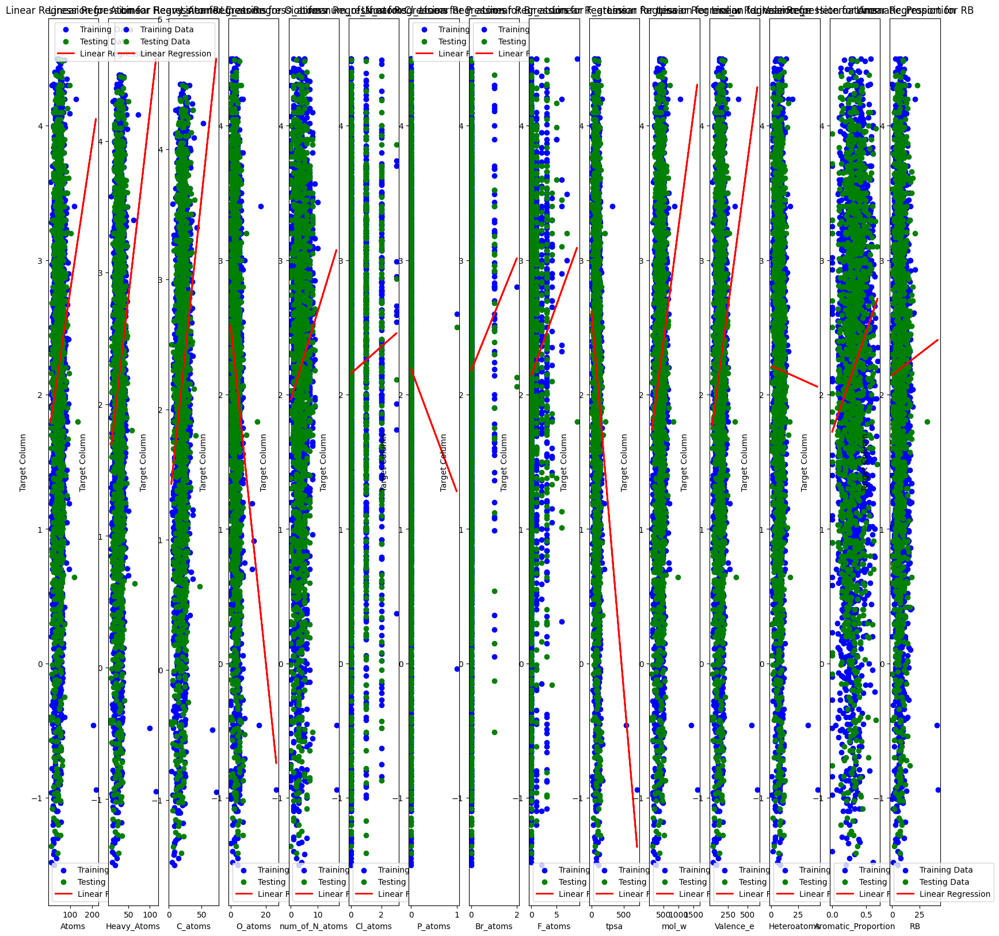

In [66]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score, mean_squared_error
fig, axes = plt.subplots(1, len(X_train.columns), figsize=(20, 20))

for i, feature in enumerate(X_train.columns):
    # Reshape the data to meet the requirements of LinearRegression
    X_train_feature = X_train[feature].values.reshape(-1, 1)
    X_test_feature = X_test[feature].values.reshape(-1, 1)

    # Create and fit the linear regression model
    model = LinearRegression()
    model.fit(X_train_feature, y_train)

    # Make predictions on training and testing sets
    y_train_pred = model.predict(X_train_feature)
    y_test_pred = model.predict(X_test_feature)

    # Calculate metrics
    r2_train = r2_score(y_train, y_train_pred)
    mse_train = mean_squared_error(y_train, y_train_pred)
    rmse_train = np.sqrt(mse_train)

    r2_test = r2_score(y_test, y_test_pred)
    mse_test = mean_squared_error(y_test, y_test_pred)
    rmse_test = np.sqrt(mse_test)

    # Plotting
    axes[i].scatter(X_train_feature, y_train, color='blue', label='Training Data')
    axes[i].scatter(X_test_feature, y_test, color='green', label='Testing Data')
    axes[i].plot(X_train_feature, y_train_pred, color='red', linewidth=2, label='Linear Regression')
    axes[i].set_title(f'Linear Regression for {feature}')
    axes[i].set_xlabel(feature)
    axes[i].set_ylabel('Target Column')
    axes[i].legend()

    # Display metrics
    print(f"\nMetrics for {feature}:")
    print("Training Set - R^2:", r2_train, "MSE:", mse_train, "RMSE:", rmse_train)
    print("Testing Set - R^2:", r2_test, "MSE:", mse_test, "RMSE:", rmse_test)

plt.show()

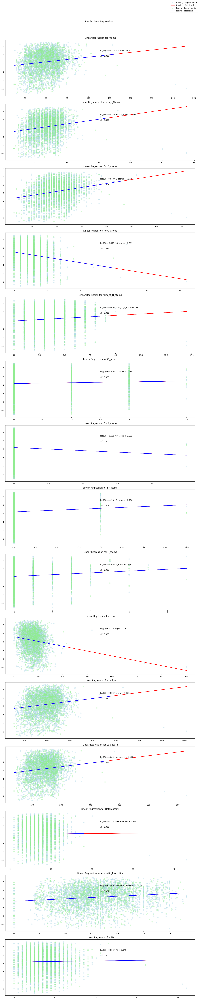

In [67]:
num_features = X_train.shape[1]

# Determine the number of rows and columns for subplots
num_rows = int(np.ceil(num_features ))
num_cols = 1

# Create a subplot with dynamic grid size
fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, 5 * num_rows))
fig.suptitle('Simple Linear Regressions')

# Flatten the 2D array of subplots for easier iteration
for i, (ax, col) in enumerate(zip(axes.flatten(), X_train.columns)):
    # Extract the feature from the training set
    x_train_feature = X_train[col].values.reshape(-1, 1)

    # Create and fit the linear regression model
    model = LinearRegression()
    model.fit(x_train_feature, y_train)

    # Make predictions on training set
    y_train_pred = model.predict(x_train_feature)

    # Calculate R^2 score
    r2_train = r2_score(y_train, y_train_pred)

    # Scatter plot of the training data
    true_train = ax.scatter(x_train_feature, y_train, color='lightblue', marker='o', alpha=0.4, label='Training - Experimental')

    # Plot the linear regression line
    pred_train, = ax.plot(x_train_feature, y_train_pred, 'r', label='Training - Predicted')

    # Annotate the plot with the regression formula and R^2 score
    coefficient = model.coef_[0]
    intercept = model.intercept_
    formula = f"log(S) = {coefficient:.3f} * {col} + {intercept:.3f}"
    ax.annotate(formula, (.5, .8), xycoords='axes fraction', size=10)
    ax.annotate(f"$R^2$: {r2_train:.3f}", (.5, .7), xycoords='axes fraction', size=10)

    # Extract the feature from the testing set
    x_test_feature = X_test[col].values.reshape(-1, 1)

    # Make predictions on testing set
    y_test_pred = model.predict(x_test_feature)

    # Scatter plot of the testing data
    true_test = ax.scatter(x_test_feature, y_test, color='lightgreen', marker='o', alpha=0.4, label='Testing - Experimental')

    # Plot the linear regression line for testing set
    pred_test, = ax.plot(x_test_feature, y_test_pred, 'b', label='Testing - Predicted')

    # Set subplot title with feature name
    ax.set_title(f'Linear Regression for {col}')

# Display legend in the upper right corner
fig.legend(handles=[true_train, pred_train, true_test, pred_test], loc='upper right')

# Adjust layout and save the figure
fig.tight_layout(rect=[0, 0, 1, 0.97])  # Adjust the rectangle to leave space for the suptitle
plt.savefig('simple_lrs.png')

# Show the figure
plt.show()

In [68]:
X=X.drop('smiles',axis=1)


In [69]:
X=X.drop('pH',axis=1)
X=X.drop('mol',axis=1)

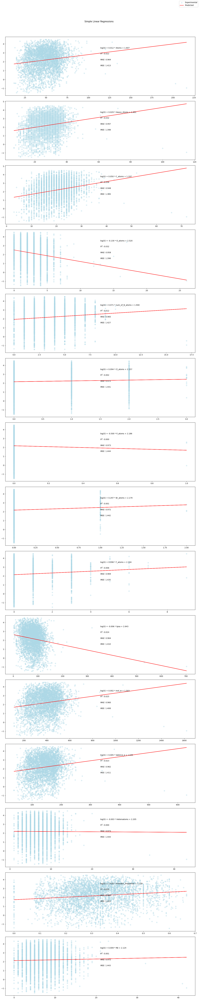

In [70]:
# Determine the number of rows and columns for subplots
num_rows = X.shape[1]
num_cols = 1

# Create a subplot with dynamic grid size
fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, 5 * num_rows))
fig.suptitle('Simple Linear Regressions')

# Flatten the 2D array of subplots for easier iteration
for i, (ax, col) in enumerate(zip(axes.flatten(), X.columns)):
    # Extract the feature
    x_feature = X[col].values.reshape(-1, 1)

    # Create and fit the linear regression model
    model = LinearRegression()
    model.fit(x_feature, y)

    # Make predictions
    y_pred = model.predict(x_feature)

    from sklearn.metrics import mean_squared_error, mean_absolute_error

    # Calculate R^2 score
    r2 = r2_score(y, y_pred)

    # Calculate Mean Squared Error (MSE)
    mse = mean_squared_error(y, y_pred)

    # Calculate Mean Absolute Error (MAE)
    mae = mean_absolute_error(y, y_pred)

    # Scatter plot of the data
    true_data = ax.scatter(x_feature, y, color='lightblue', marker='o', alpha=0.4, label='Experimental')

    # Plot the linear regression line
    pred_data, = ax.plot(x_feature, y_pred, 'r', label='Predicted')

    # Annotate the plot with the regression formula and R^2 score
    coefficient = model.coef_[0]
    intercept = model.intercept_
    formula = f"log(S) = {coefficient:.3f} * {col} + {intercept:.3f}"
    ax.annotate(formula, (.5, .8), xycoords='axes fraction', size=10)
    ax.annotate(f"$R^2$: {r2:.3f}", (.5, .7), xycoords='axes fraction', size=10)
    ax.annotate(f"$MAE$: {mae:.3f}", (.5, .6), xycoords='axes fraction', size=10)
    ax.annotate(f"$MSE$: {mse:.3f}", (.5, .5), xycoords='axes fraction', size=10)
    plt.savefig(f"{col}.png")

# Display legend in the upper right corner
fig.legend(handles=[true_data, pred_data], loc='upper right')

# Adjust layout and save the figure
fig.tight_layout(rect=[0, 0, 1, 0.97])  # Adjust the rectangle to leave space for the suptitle
plt.savefig('simple_lrs.png')

# Show the figure
plt.show()

The linear regression algorithm plots, indicate that heavy atoms and no. of O atoms also play a more important role in determining the value of logD as comapred to other features. The significance of no. of P atoms is 0 however.

Correlation Matrix:
                        Atoms  Heavy_Atoms   C_atoms   O_atoms  \
Atoms                1.000000     0.948785  0.947864  0.498542   
Heavy_Atoms          0.948785     1.000000  0.943021  0.548420   
C_atoms              0.947864     0.943021  1.000000  0.429640   
O_atoms              0.498542     0.548420  0.429640  1.000000   
num_of_N_atoms       0.363767     0.444782  0.279627 -0.109463   
Cl_atoms             0.042201     0.098450  0.045098  0.033118   
P_atoms             -0.012382    -0.011035 -0.018218  0.034106   
Br_atoms            -0.046327    -0.038648 -0.053313 -0.047649   
F_atoms              0.068125     0.188469  0.051002  0.042804   
tpsa                 0.477945     0.592141  0.370307  0.631717   
mol_w                0.922437     0.980088  0.892544  0.572009   
Valence_e            0.964221     0.993961  0.928293  0.576539   
Heteroatoms          0.586172     0.732420  0.464145  0.580785   
Aromatic_Proportion -0.518487    -0.322204 -0.320498 -0.

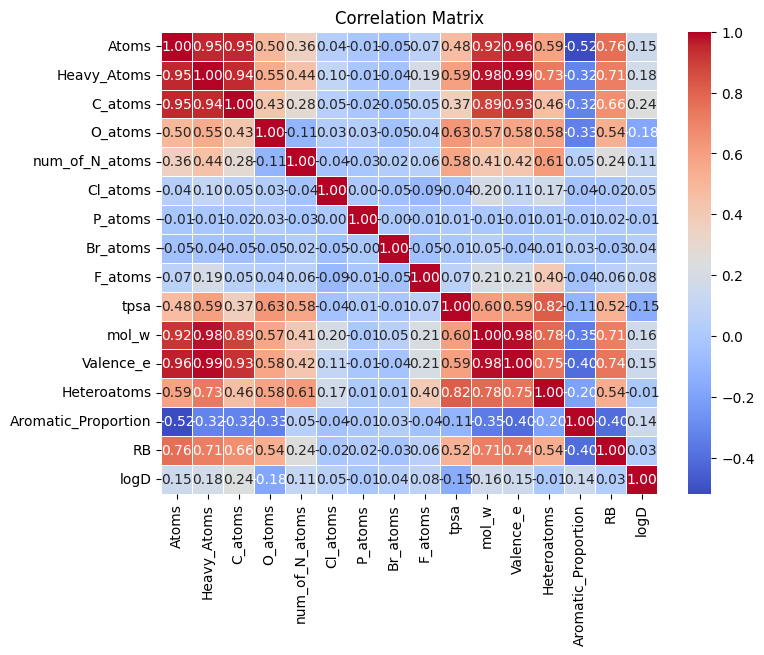

In [71]:
correlation_matrix = not_symmetry_data.drop(columns=['smiles','pH','mol']).corr()

# Display the correlation matrix
print("Correlation Matrix:")
print(correlation_matrix)

# visualizing the correlation matrix as a heatmap for better understanding
plt.figure(figsize=(8, 6))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=.5)
plt.title('Correlation Matrix')
plt.savefig('heatmap_logD.png')
plt.show()

From the following heatmap, it is clear that Number of Carbon Atoms has the largest magnitude of correlation with the target lodD i.e (0.24)

In [72]:
yr=not_symmetry_data['logD'].values

In [73]:
Xr = pd.concat((pd.DataFrame(X), not_symmetry_data.drop(["smiles", "pH","mol","logD"], axis=1)), axis=1)

In [74]:
#Ridge Regression
from sklearn.linear_model import RidgeCV
alphas = [0.1, 1.0, 10.0]
ridge_model = RidgeCV(alphas=alphas)
ridge_model.fit(X_train, y_train)

RidgeCV(alphas=[0.1, 1.0, 10.0])

In [75]:
def plot_evaluation(model, X_test, y_test, title="Test"):
    """
    Scatter plot between target and prediction logD values
    """

    prediction = np.squeeze(model.predict(X_test))
    mae = mean_absolute_error(y_test, prediction)
    mse = mean_squared_error(y_test, prediction)
    r2=r2_score(y_test,prediction)

    plt.figure(figsize=(10,10))
    sns.regplot(x=prediction, y=y_test, scatter_kws={"color": "blue"}, line_kws={"color": "red"});
    plt.xlabel('Model Prediction', fontsize=24);
    plt.ylabel('Measured logD', fontsize=24);
    plt.xticks(fontsize=24);
    plt.yticks(fontsize=24);
    plt.suptitle('Predicting logD from SMILES', fontsize=32);
    plt.title(f'{title}: MAE = {mae:.3f}, MSE = {mse:.3f}, R2 = {r2:3f}', fontsize=20);
    plt.grid(True);

    cc = np.corrcoef(y_test, prediction)
    plt.text(-1.5, 2, f"Correlation\ncoefficient\n{cc[0][1]:.4f}", fontsize=24,
             horizontalalignment="center", backgroundcolor="black", color="white")
#     print('MAE score:', round(mae, 4))
#     print('MSE score:', round(mse,4))
    plt.savefig(f"{title}.png")

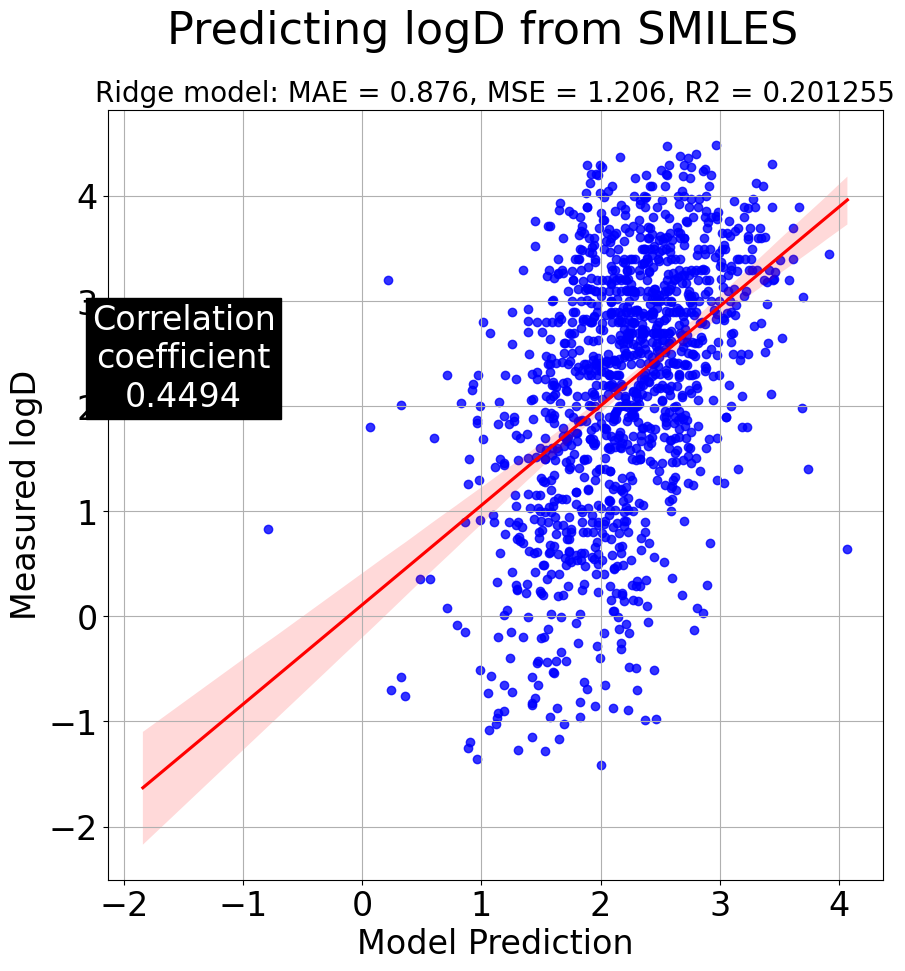

In [76]:
plot_evaluation(ridge_model, X_test, y_test, "Ridge model")

In [77]:
from sklearn.linear_model import Ridge
ridge_regr_logD = Ridge(alpha=8)
ridge_regr_logD.fit(X_train, y_train)
y_pred_ridreg_logD_test = ridge_regr_logD.predict(X_test)

print('Coefficient of determination for test case: {}'.format(r2_score(y_test, y_pred_ridreg_logD_test)))

Coefficient of determination for test case: 0.20388025640669016


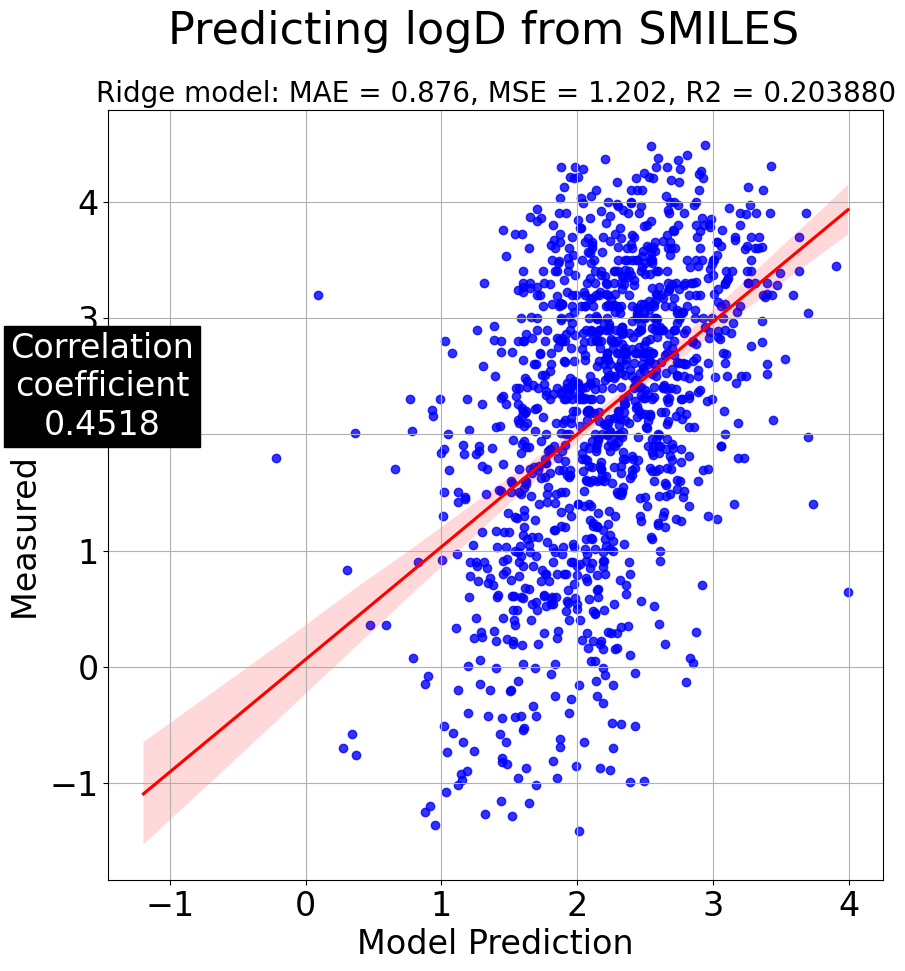

In [78]:
plot_evaluation(ridge_regr_logD, X_test, y_test, "Ridge model")

In [79]:
#Kernel Ridge - linear
from sklearn.kernel_ridge import KernelRidge
kernelridge_linear_regr_logD = KernelRidge(alpha=1.52,kernel='linear')
kernelridge_linear_regr_logD.fit(X_train, y_train)
y_pred_kerreg_linear_logD_test = kernelridge_linear_regr_logD.predict(X_test)
print('Coefficient of determination for validation case: {}'.format(r2_score(y_test, y_pred_kerreg_linear_logD_test)))


Coefficient of determination for validation case: 0.19371261762970204


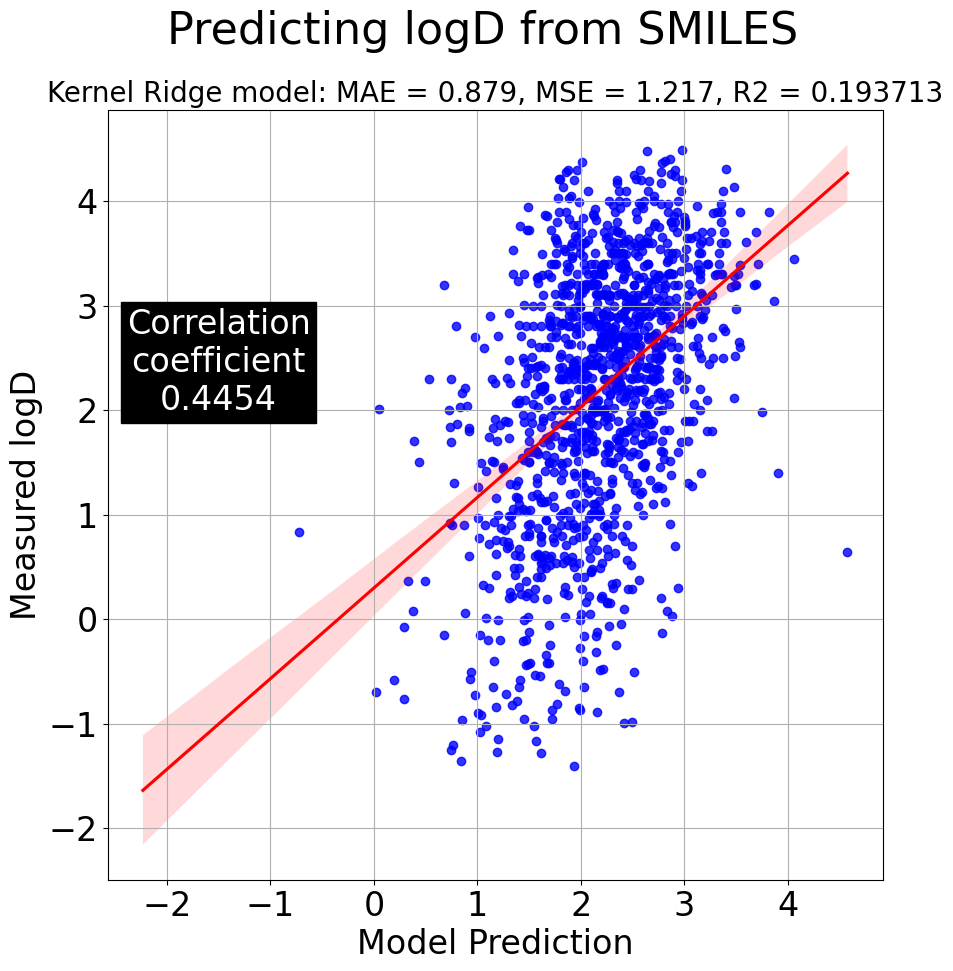

In [80]:
plot_evaluation(kernelridge_linear_regr_logD, X_test, y_test, "Kernel Ridge model")

In [81]:
#Kernel Ridge - rbf
kernelridge_rbf_regr_logD = KernelRidge(alpha=1.52,kernel='rbf')
kernelridge_rbf_regr_logD.fit(X_train, y_train)
y_pred_kerreg_rbf_logD_test = kernelridge_rbf_regr_logD.predict(X_test)
print('Coefficient of determination for testing case: {}'.format(r2_score(y_test, y_pred_kerreg_rbf_logD_test)))

Coefficient of determination for testing case: -2.1937402007511735


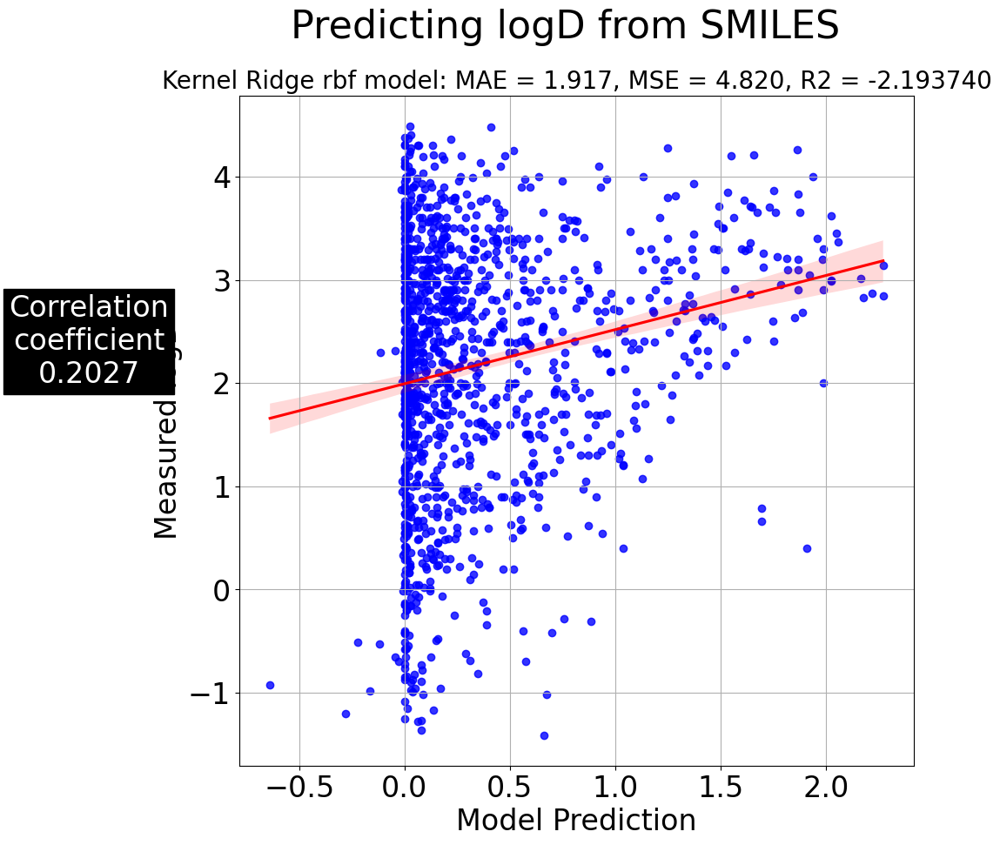

In [82]:
plot_evaluation(kernelridge_rbf_regr_logD, X_test, y_test, "Kernel Ridge rbf model")

In [83]:
#Kernel Ridge - polynomial
kernelridge_poly_regr_logD = KernelRidge(alpha=0.001,kernel='poly',degree=2)
kernelridge_poly_regr_logD.fit(X_train, y_train)
y_pred_kerreg_poly_logD_test = kernelridge_poly_regr_logD.predict(X_test)
print('Coefficient of determination for test case: {}'.format(r2_score(y_test, y_pred_kerreg_poly_logD_test)))

Coefficient of determination for test case: 0.24542803921850964


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_ridge.py:253: LinAlgWarning: Ill-conditioned matrix (rcond=1.48256e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)


In [84]:
#checking if the matrix rank is alright
print(np.linalg.matrix_rank(X_train))

14


In [85]:
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import PolynomialFeatures
def plot_evaluation2(model, X_test, y_test, title="Kernel ridge"):
    """
    Scatter plot between target and prediction logD values
    """

    prediction = np.squeeze(model.predict(X_test))
    mae = mean_absolute_error(y_test, prediction)
    mse = mean_squared_error(y_test, prediction)
    r2 = r2_score(y_test, prediction)

    plt.figure(figsize=(10, 10))

    # Modify this part to handle polynomial features
    polynomial_degree = 3  # Adjust as needed
    poly_model = make_pipeline(PolynomialFeatures(degree=polynomial_degree), KernelRidge(alpha=0.01, kernel='poly',degree=2))
    poly_model.fit(X_test, y_test)
    transformed_X_test = poly_model.named_steps['polynomialfeatures'].transform(X_test)

    sns.regplot(x=prediction, y=y_test, scatter_kws={"color": "blue"}, line_kws={"color": "red"})
    plt.xlabel('Model Prediction', fontsize=24)
    plt.ylabel('Measured logD', fontsize=24)
    plt.xticks(fontsize=24)
    plt.yticks(fontsize=24)
    plt.suptitle('Predicting logD from SMILES', fontsize=32)
    plt.title(f'{title}: MAE = {mae:.3f}, MSE = {mse:.3f}, R2 = {r2:.3f}', fontsize=20)
    plt.grid(True)

    cc = np.corrcoef(y_test, prediction)
    plt.text(-1.5, 2, f"Correlation\ncoefficient\n{cc[0][1]:.4f}", fontsize=24,
             horizontalalignment="center", backgroundcolor="black", color="white")

    plt.savefig('ridge_Reg.png')


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_ridge.py:255: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(


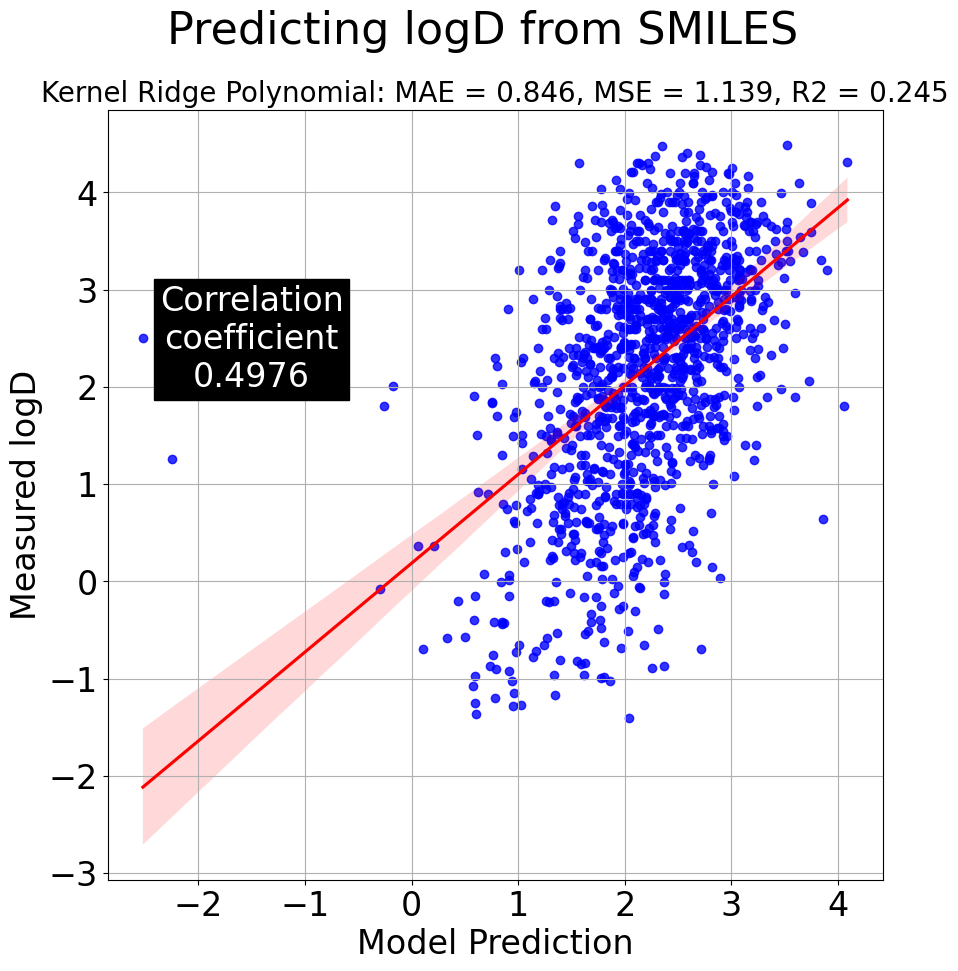

In [86]:
plot_evaluation2(kernelridge_poly_regr_logD, X_test, y_test,"Kernel Ridge Polynomial")

Performing hyperparameter tuning for Ridge regression model using Grid Search Cross-Validation.

In [87]:
from sklearn.model_selection import GridSearchCV

ridge=Ridge()
parameters={'alpha':[1e-15,1e-10,1e-8,1e-3,1e-2,1,5,10,20,30,35,40,45,50,55,100]}
ridge_regressor=GridSearchCV(ridge,parameters,scoring='neg_mean_squared_error',cv=5)
ridge_regressor.fit(X,y)
print(ridge_regressor.best_params_)
print(ridge_regressor.best_score_)

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_ridge.py:216: LinAlgWarning: Ill-conditioned matrix (rcond=5.07228e-20): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_ridge.py:216: LinAlgWarning: Ill-conditioned matrix (rcond=1.01392e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_ridge.py:216: LinAlgWarning: Ill-conditioned matrix (rcond=1.94984e-18): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_ridge.py:216: LinAlgWarning: Ill-conditioned matrix (rcond=1.48787e-18): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_ridge.py:216: LinAlgWarnin

{'alpha': 1}
-1.1247311945493634


<ipython-input-88-4095a84484ce>:2: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(y_test-y_pred_kerreg_poly_logD_test)


<Axes: xlabel='logD', ylabel='Density'>

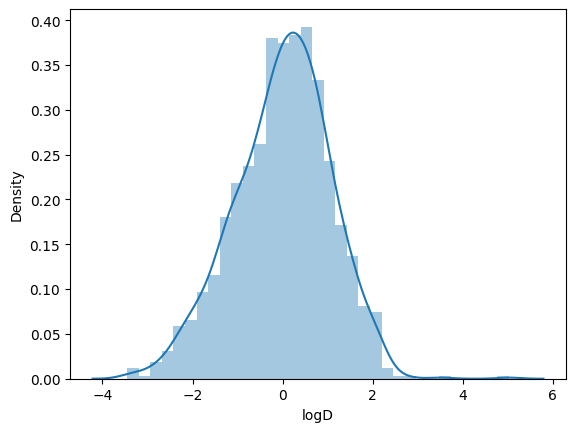

In [88]:
# for kernel ridge polynomial
sns.distplot(y_test-y_pred_kerreg_poly_logD_test)

<ipython-input-89-eba3f0f53c23>:2: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(y_test-y_pred_kerreg_rbf_logD_test)


<Axes: xlabel='logD', ylabel='Density'>

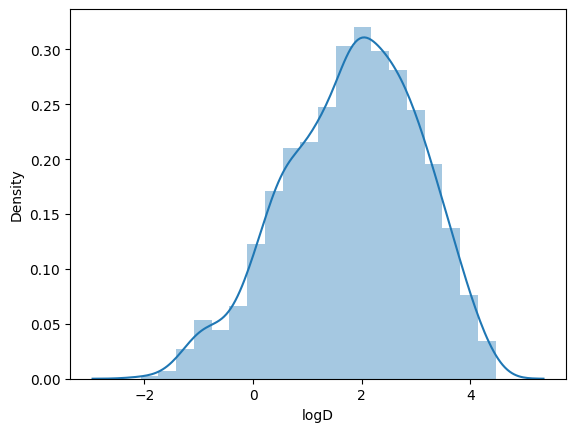

In [89]:
# for kernel ridge - rbf
sns.distplot(y_test-y_pred_kerreg_rbf_logD_test)

In [90]:
#lASSO Regression hyperparameter tuning
from sklearn.linear_model import Lasso
from sklearn.model_selection import GridSearchCV
lasso=Lasso()
parameters={'alpha':[1e-15,1e-10,1e-8,1e-3,1e-2,1,5,10,20,30,35,40,45,50,55,100]}
lasso_regressor=GridSearchCV(lasso,parameters,scoring='neg_mean_squared_error',cv=5)

lasso_regressor.fit(X,y)
print(lasso_regressor.best_params_)
print(lasso_regressor.best_score_)

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.897e+03, tolerance: 4.864e-01
  model = cd_fast.enet_coordinate_descent(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.844e+03, tolerance: 4.736e-01
  model = cd_fast.enet_coordinate_descent(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.870e+03, tolerance: 4.856e

{'alpha': 0.001}
-1.127716379625137


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.157e+03, tolerance: 6.016e-01
  model = cd_fast.enet_coordinate_descent(


<ipython-input-91-c9e0ed3e4a18>:2: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(y_test-y_pred_kerreg_linear_logD_test)


<Axes: xlabel='logD', ylabel='Density'>

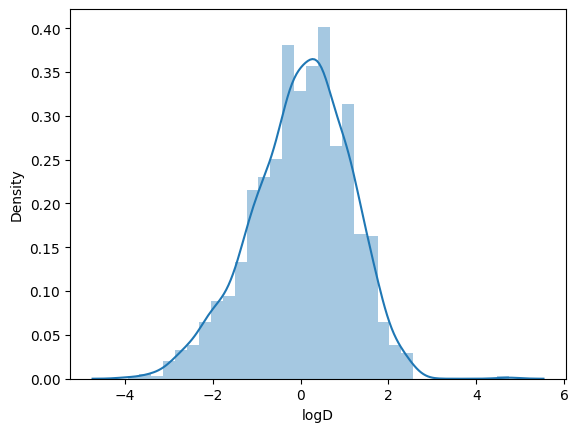

In [91]:
# for kernel ridge - linear
sns.distplot(y_test-y_pred_kerreg_linear_logD_test)

<ipython-input-92-f8e4214cab75>:2: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(y_test-y_pred_ridreg_logD_test)


<Axes: xlabel='logD', ylabel='Density'>

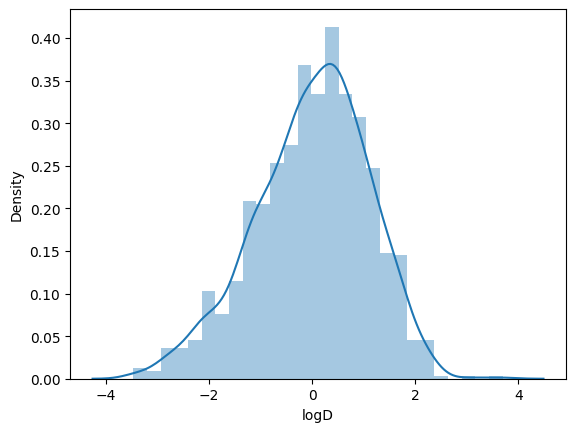

In [92]:
# for simple ridge regression
sns.distplot(y_test-y_pred_ridreg_logD_test)

Since, simple redge, polynomial kernel ridge and linear kernel ridge are centered around 0, we can say that on an avg, the target value is close to the predicted value for these models and the variance is highest for rbf kernel ridge regression followed by simple ridge and linear and polynomial kernel ridge in the same order.

For simple ridge, probability density of y_test-y_pred=0: 0.35

For linear kernel ridge, probability density of y_test-y_pred=0: 0.37

For rbf kernel ridge, probability density of y_test-y_pred=0: 0.10

For plynomial kernel ridge, probability density of y_test-y_pred=0: 0.385


Justifyng the need for lasso regression

In [93]:
#putting together the coefficient and their corresponding variable names from linear regression
lreg = LinearRegression()
lreg.fit(X_train, y_train)
y_pred = lreg.predict(X_test)
mse = np.mean((y_pred - y_test)**2)
print("Mean Squared Error:", mse)
lreg_coef = pd.DataFrame()
lreg_coef['Columns']= X_train.columns
lreg_coef['Coefficient Estimate']= pd.Series(lreg.coef_)
print(lreg_coef)

Mean Squared Error: 1.2087701915025184
                Columns  Coefficient Estimate
0                 Atoms             -0.890850
1           Heavy_Atoms             -2.082539
2               C_atoms             -0.266002
3               O_atoms             -0.244339
4        num_of_N_atoms              0.755089
5              Cl_atoms             -0.864070
6               P_atoms             -0.295533
7              Br_atoms             -0.004543
8               F_atoms             -0.997789
9                  tpsa             -0.017036
10                mol_w             -0.010474
11            Valence_e              0.869193
12          Heteroatoms             -1.816537
13  Aromatic_Proportion              1.411809
14                   RB              0.012397


The coefficient estimates represent the slopes of the regression equation. Each coefficient corresponds to a predictor variable and reflects the change in the response variable for a one-unit change in that predictor, holding other predictors constant.

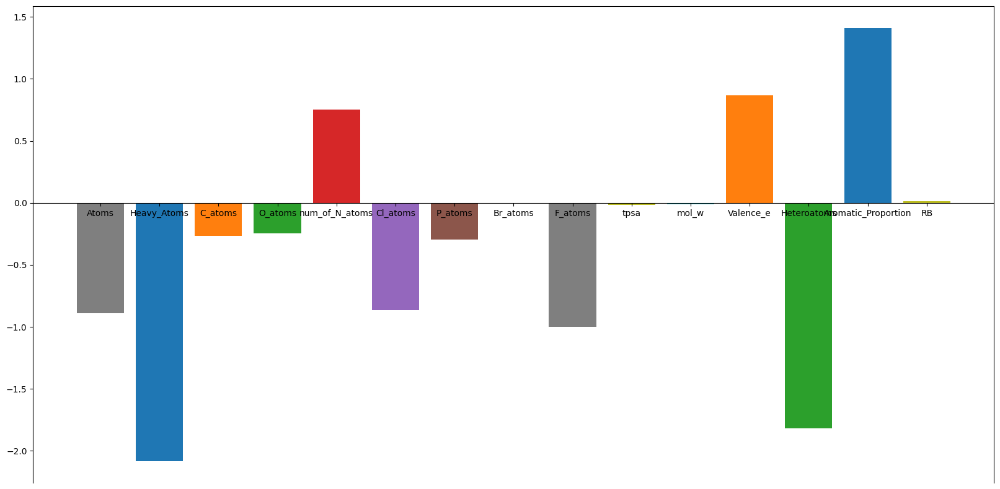

In [94]:
#plotting the coefficient score
fig, ax = plt.subplots(figsize=(20,10))
color =['tab:gray','tab:blue','tab:orange','tab:green','tab:red','tab:purple','tab:brown',
        'tab:pink','tab:gray','tab:olive','tab:cyan','tab:orange','tab:green','tab:blue','tab:olive']

ax.bar(lreg_coef["Columns"],
lreg_coef['Coefficient Estimate'],
color = color)

ax.spines['bottom'].set_position('zero')

plt.style.use('ggplot')
plt.show()

As we can observe that lots of the variables:

1. Br_Atoms

2. TPSA Value

3. Molecular Weight

4. Number of rotatable Bonds

have an insignificant coefficient, these coefficients did not contribute to the model very much and need to regulate or even eliminate some of these variables.

In Lasso Regression, we add Mean Absolute Value of coefficients.

Lasso regression can completely eliminate the variable by reducing its coefficient value to 0.

In [95]:
from sklearn.linear_model import Lasso
lasso = Lasso()
lasso.fit(X_train, y_train)
y_pred1_lasso = lasso.predict(X_test)

In [96]:
##Calculating the Mean-Squared Error(MSE):
mse1 = np.mean((y_pred1_lasso - y_test)**2)
print("Mean Squared Error: ", mse1)

Mean Squared Error:  1.3408919370916275


Since mean squared error increased, while lasso regression did help in removing less important features, the important features got penalized too much
and thus perhaps the default alpha was not optimal

In [97]:
"""putting together the coefficient and their corresponding variable names"""
lasso_coef = pd.DataFrame()
lasso_coef['Columns'] = X_train.columns
lasso_coef['Coefficient Estimate'] = pd.Series(lasso.coef_)
print(lasso_coef)

                Columns  Coefficient Estimate
0                 Atoms             -0.000000
1           Heavy_Atoms              0.000000
2               C_atoms              0.000000
3               O_atoms             -0.000000
4        num_of_N_atoms              0.000000
5              Cl_atoms             -0.000000
6               P_atoms             -0.000000
7              Br_atoms              0.000000
8               F_atoms              0.000000
9                  tpsa             -0.012788
10                mol_w              0.004008
11            Valence_e              0.000000
12          Heteroatoms             -0.000000
13  Aromatic_Proportion              0.000000
14                   RB             -0.000000


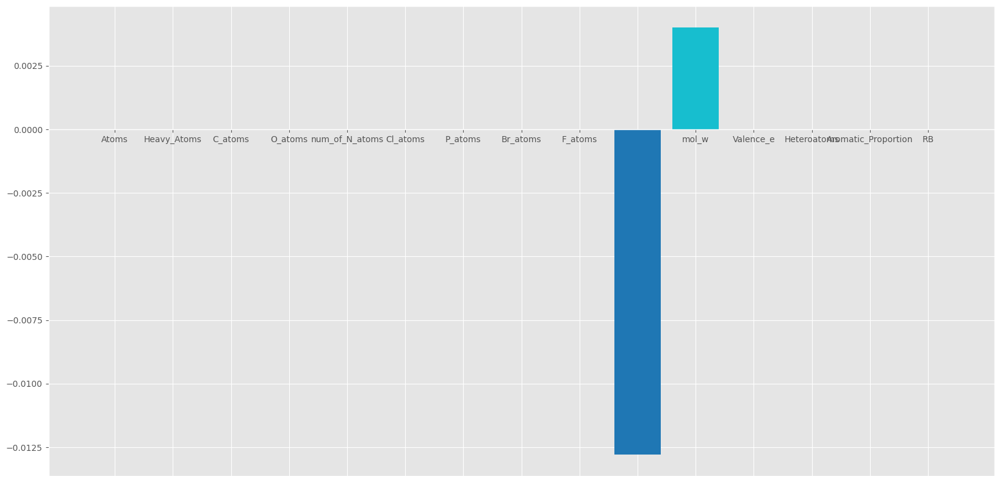

In [98]:
#plotting the coefficient score
fig, ax = plt.subplots(figsize=(20,10))
color =['tab:gray','tab:olive','tab:orange','tab:green','tab:red','tab:purple','tab:brown',
        'tab:pink','tab:gray','tab:blue','tab:cyan','tab:orange','tab:green','tab:blue','tab:olive']

ax.bar(lasso_coef["Columns"],
lasso_coef['Coefficient Estimate'],
color = color)

ax.spines['bottom'].set_position('zero')

plt.style.use('ggplot')
plt.show()

In [99]:
from sklearn.linear_model import LassoCV
# Finding the optimal alpha for lasso regressor
alphas = np.logspace(-4, 4, 1000)

# Create a LassoCV model with cross-validation
lasso_cv = LassoCV(alphas=alphas, cv=5)

# Fit the model on the training data
lasso_cv.fit(X_train, y_train)

# Print the optimal alpha value
print("Optimal alpha:", lasso_cv.alpha_)


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_coordinate_descent.py:617: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2.93805059016222, tolerance: 0.32827078234562596
  model = cd_fast.enet_coordinate_descent_gram(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_coordinate_descent.py:617: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 6.626704520978365, tolerance: 0.32827078234562596
  model = cd_fast.enet_coordinate_descent_gram(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_coordinate_descent.py:617: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 11.924050418132083, tolerance: 0.32827078234562596
  model = cd_fast.enet_coordinate_descent_gram(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_coordinate_descent.py:617: Converge

Optimal alpha: 0.0001


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_coordinate_descent.py:617: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1209.484438289298, tolerance: 0.32647765404373935
  model = cd_fast.enet_coordinate_descent_gram(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_coordinate_descent.py:617: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1209.7480072187166, tolerance: 0.32647765404373935
  model = cd_fast.enet_coordinate_descent_gram(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_coordinate_descent.py:617: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1210.0063020695638, tolerance: 0.32647765404373935
  model = cd_fast.enet_coordinate_descent_gram(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_coordinate_descent.py:617: Conver

In [100]:
# Use the optimal alpha to fit the final Lasso model
lasso_final = Lasso(alpha=0.001111)
lasso_final.fit(X_train, y_train)

# Evaluate the model on the test set (optional)
mse_test = mean_squared_error(y_test, lasso_final.predict(X_test))
print("Mean Squared Error on Test Set:", mse_test)


Mean Squared Error on Test Set: 1.1987501270878642


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.478e+03, tolerance: 4.129e-01
  model = cd_fast.enet_coordinate_descent(


After several dry experiments we found 0.001111 to be the optimal alpha value for lasso regressor

In [101]:
"""putting together the coefficient and their corresponding variable names"""
lasso_coef = pd.DataFrame()
lasso_coef['Columns'] = X_train.columns
lasso_coef['Coefficient Estimate'] = pd.Series(lasso_final.coef_)
print(lasso_coef)

                Columns  Coefficient Estimate
0                 Atoms             -0.042282
1           Heavy_Atoms              0.107286
2               C_atoms              0.038840
3               O_atoms             -0.048365
4        num_of_N_atoms              0.114860
5              Cl_atoms             -0.015886
6               P_atoms             -0.000000
7              Br_atoms              0.288612
8               F_atoms              0.034743
9                  tpsa             -0.016621
10                mol_w              0.001228
11            Valence_e              0.000420
12          Heteroatoms             -0.035160
13  Aromatic_Proportion              1.065721
14                   RB              0.014671


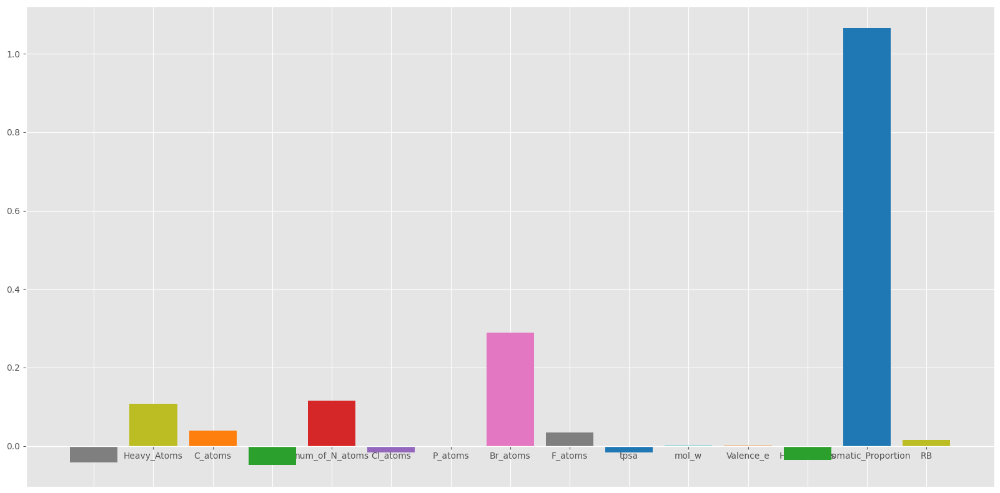

In [102]:
#plotting the coefficient score for optimal lasso regressor
fig, ax = plt.subplots(figsize=(20,10))
color =['tab:gray','tab:olive','tab:orange','tab:green','tab:red','tab:purple','tab:brown',
        'tab:pink','tab:gray','tab:blue','tab:cyan','tab:orange','tab:green','tab:blue','tab:olive']

ax.bar(lasso_coef["Columns"],
lasso_coef['Coefficient Estimate'],
color = color)

ax.spines['bottom'].set_position('zero')

plt.style.use('ggplot')
plt.show()

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_ridge.py:255: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(


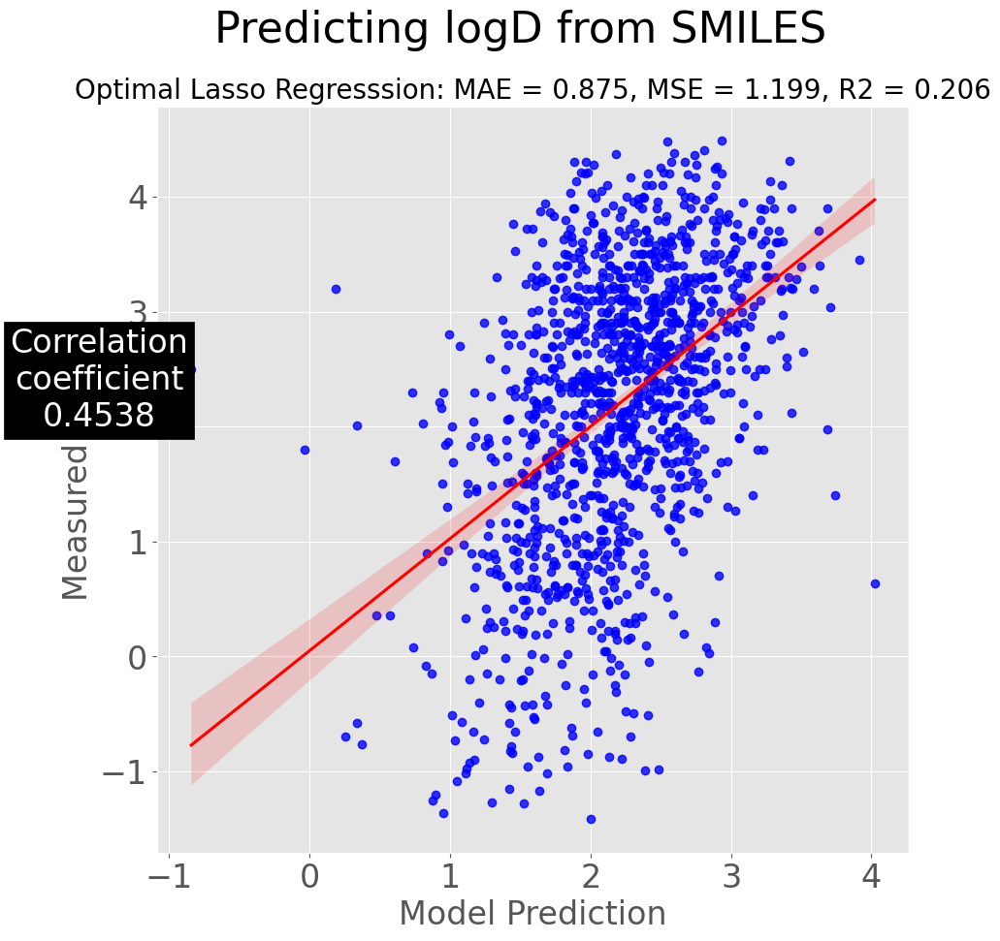

In [103]:
plot_evaluation2(lasso_final, X_test, y_test,"Optimal Lasso Regresssion")

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_ridge.py:255: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(


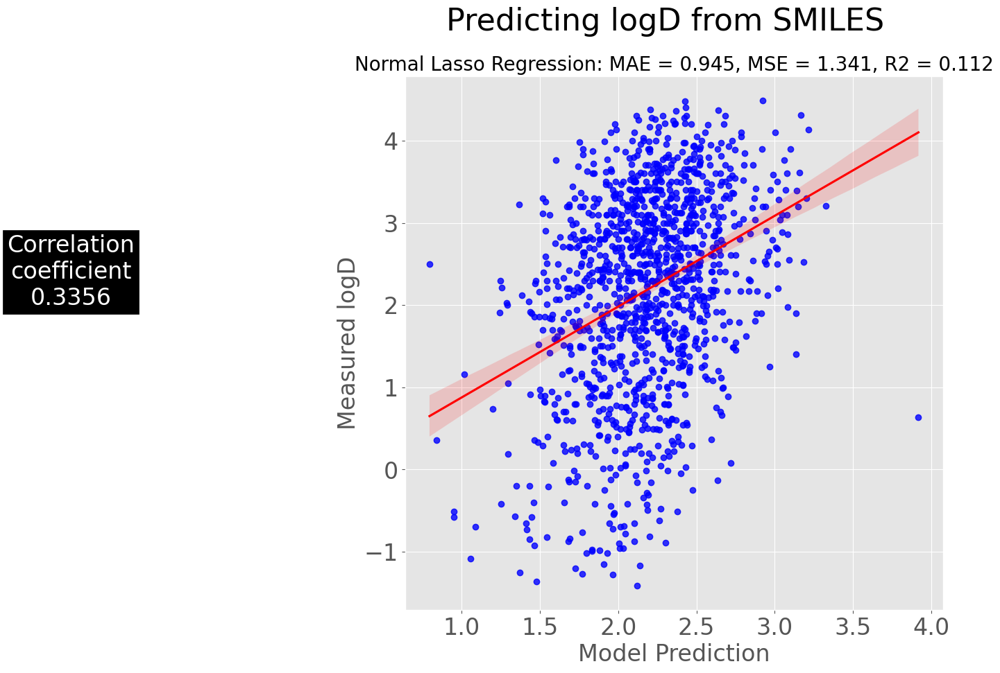

In [104]:
plot_evaluation2(lasso, X_test, y_test,"Normal Lasso Regression")

Thus we can see a significant increase in R-squared value of lasso regressor from 0.112 to 0.206 on using an optimal alpha.

The mean squared error for optimal lasso regressor fell down to 1.1987501781024976 from 1.2087701915025173.

Also the lasso regressor model explains the variance in dataset much better than simple linear regressor since the r-squared value is 0.206 which is much higher than the values we saw for each varaiable in simple linear regression where were of the order 0.001~5

<ipython-input-105-f81786952154>:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(y_test-lasso_final.predict(X_test))


<Axes: xlabel='logD', ylabel='Density'>

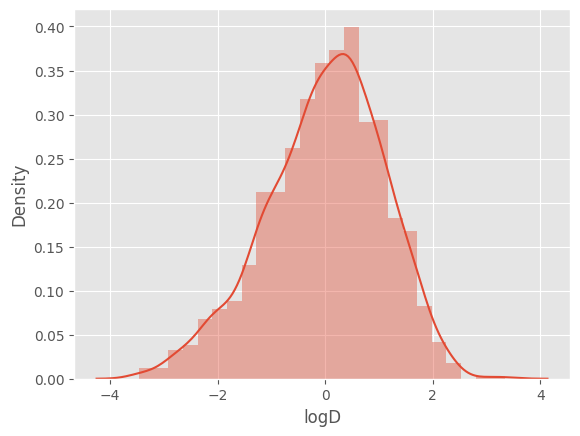

In [105]:
sns.distplot(y_test-lasso_final.predict(X_test))

In [106]:
#Elastic Net Regression

from sklearn.linear_model import ElasticNet
enet = ElasticNet()
enet.fit(X_test, y_test)
y_pred3 = enet.predict(X_test)

In [107]:
#Calculating0 the Mean Squared Error
mse3 = np.mean((y_pred3 - y_test)**2)
print("Mean Squared Error:", mse3)

Mean Squared Error: 1.3395206992793156


In [108]:
# finding optimal hyperparameters for elastic net

from sklearn.linear_model import ElasticNetCV

# Define a range of alpha values to search over
alphas = np.logspace(-4, 4, 1000)

# Define a range of l1_ratio values to search over
l1_ratios = np.linspace(0.1, 1.0, 10)

# Create an ElasticNetCV model with cross-validation
elastic_net_cv = ElasticNetCV(alphas=alphas, l1_ratio=l1_ratios, cv=5)

# Fit the model on the training data
elastic_net_cv.fit(X_train, y_train)

# Print the optimal alpha and l1_ratio values
print("Optimal alpha:", elastic_net_cv.alpha_)
print("Optimal l1_ratio:", elastic_net_cv.l1_ratio_)



Streaming output truncated to the last 5000 lines.
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_coordinate_descent.py:617: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1243.598280815804, tolerance: 0.3350756629502573
  model = cd_fast.enet_coordinate_descent_gram(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_coordinate_descent.py:617: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1244.057754620584, tolerance: 0.3350756629502573
  model = cd_fast.enet_coordinate_descent_gram(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_coordinate_descent.py:617: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1244.5060179766429, tolerance: 0.3350756629502573
  model = cd_fast.enet_coordinate_descent_gram(
/usr/local/lib/python3.10/dist-packages/sklearn/

Optimal alpha: 0.0001
Optimal l1_ratio: 0.1


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_coordinate_descent.py:617: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1213.1539591611609, tolerance: 0.32647765404373935
  model = cd_fast.enet_coordinate_descent_gram(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_coordinate_descent.py:617: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1213.3504908051523, tolerance: 0.32647765404373935
  model = cd_fast.enet_coordinate_descent_gram(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_coordinate_descent.py:617: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1213.5438312583506, tolerance: 0.32647765404373935
  model = cd_fast.enet_coordinate_descent_gram(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_coordinate_descent.py:617: Conve

In [109]:
elastic_net_final = ElasticNet(alpha=0.001123, l1_ratio=1.0)
elastic_net_final.fit(X_train, y_train)

# Evaluate the model on the test set (optional)
mse_test = mean_squared_error(y_test, elastic_net_final.predict(X_test))
print("Mean Squared Error on Test Set:", mse_test)

Mean Squared Error on Test Set: 1.1987499364491647


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.477e+03, tolerance: 4.129e-01
  model = cd_fast.enet_coordinate_descent(


In [110]:
X_test

,Atoms,Heavy_Atoms,C_atoms,O_atoms,num_of_N_atoms,Cl_atoms,P_atoms,Br_atoms,F_atoms,tpsa,mol_w,Valence_e,Heteroatoms,Aromatic_Proportion,RB
1937,26,19,9,2,7,0,0,0,0,115.42,277.038193,96,10,0.538462,4
1543,36,19,14,0,5,0,0,0,0,68.24,255.148396,98,5,0.361111,6
3380,45,24,20,1,3,0,0,0,0,60.91,319.168462,122,4,0.377778,7
2453,70,40,26,7,4,2,0,0,0,161.06,612.121226,216,14,0.228571,13
2522,64,35,28,4,3,0,0,0,0,94.82,471.215806,180,7,0.281250,11
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2915,48,25,18,2,2,0,0,1,0,49.41,442.038432,136,7,0.229167,6
2877,62,32,28,2,2,0,0,0,0,55.56,426.230728,164,4,0.290323,7
1097,80,39,32,4,3,0,0,0,0,90.90,531.309707,208,7,0.225000,19
1650,59,32,22,3,3,2,0,0,0,97.38,515.087089,174,10,0.254237,15


In [111]:
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import PolynomialFeatures
from sklearn.metrics import mean_squared_error
import matplotlib.pyplot as plt



# Polynomial features
degree = 5 # degree of the polynomial
poly_features = PolynomialFeatures(degree=degree, include_bias=False)
X_train_poly = poly_features.fit_transform(X_train)
X_test_poly = poly_features.transform(X_test)

# Linear regression model
model = LinearRegression()
model.fit(X_train_poly, y_train)

# Make predictions

y_pred = model.predict(X_test_poly)

# Evaluate the model
mse = mean_squared_error(y_test, y_pred)
r2=r2_score(y_test, y_pred)


print(f'Mean Squared Error: {mse:.2f}')
print(f'R^2 Score: {r2}')



Mean Squared Error: 1745890.71
R^2 Score: -1156727.1882967043


In [112]:
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score




# Fit a linear regression model
model = LinearRegression()
model.fit(X_train, y_train)

# Predict on the test set
y_pred = model.predict(X_test)

# Evaluate the model
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print(f'Mean Squared Error: {mse}')
print(f'R^2 Score: {r2}')

Mean Squared Error: 1.2087701915025184
R^2 Score: 0.19913741319275735


SVM Linear Kernel

In [113]:
from sklearn.svm import SVR

svr_linear = SVR(kernel='linear',C=2.0,epsilon=0.0001)
svr_linear.fit(X_train, y_train)

y_pred = svr_linear.predict(X_test)

# Evaluate the model
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print(f'Mean Squared Error: {mse}')
print(f'R^2 Score: {r2}')


Mean Squared Error: 1.2263039607182207
R^2 Score: 0.18752053194495466


In [114]:
from sklearn.svm import SVR

svr_linear = SVR(kernel='poly',C=2.0,epsilon=0.0001)
svr_linear.fit(X_train, y_train)

y_pred = svr_linear.predict(X_test)

# Evaluate the model
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print(f'Mean Squared Error: {mse}')
print(f'R^2 Score: {r2}')


Mean Squared Error: 1.4123026610213059
R^2 Score: 0.06428833999095285


Randomforest

In [115]:
from sklearn.ensemble import RandomForestRegressor
randomforest=RandomForestRegressor(n_estimators=100,max_depth=18, random_state=200, criterion='squared_error',ccp_alpha=0.0005)
randomforest.fit(X_train,y_train)

ya_pred=randomforest.predict(X_test)
# Evaluate the model
mse = mean_squared_error(y_test, ya_pred)
r2 = r2_score(y_test, ya_pred)

print(f'Mean Squared Error: {mse}')
print(f'R^2 Score: {r2}')


Mean Squared Error: 0.8592095510049111
R^2 Score: 0.4307364721064525


In [116]:
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score

selected_features = ['tpsa', 'mol_w']
X_train_new = X_train[selected_features]
X_test_new = X_test[selected_features]



# Fit a linear regression model
model = LinearRegression()
model.fit(X_train_new, y_train)

# Predict on the test set
y_pred = model.predict(X_test_new)

# Evaluate the model
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print(f'Mean Squared Error: {mse}')
print(f'R^2 Score: {r2}')

Mean Squared Error: 1.3390412236459541
R^2 Score: 0.11282721418068642


In [117]:
X_test_new2=X_test.drop('tpsa',axis=1)
X_test_new2=X_test_new2.drop('mol_w',axis=1)
X_train_new2=X_train.drop('tpsa',axis=1)
X_train_new2=X_train_new2.drop('mol_w',axis=1)

In [118]:
# Fit a linear regression model
model = LinearRegression()
model.fit(X_train_new2, y_train)

# Predict on the test set
y_pred = model.predict(X_test_new2)

# Evaluate the model
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print(f'Mean Squared Error: {mse}')
print(f'R^2 Score: {r2}')

Mean Squared Error: 1.2551455063500723
R^2 Score: 0.1684117592397537


In [119]:
selected_features = ['Heavy_Atoms', 'Br_atoms']
X_train_new = X_train[selected_features]
X_test_new = X_test[selected_features]



# Fit a linear regression model
model = LinearRegression()
model.fit(X_train_new, y_train)

# Predict on the test set
y_pred = model.predict(X_test_new)

# Evaluate the model
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print(f'Mean Squared Error: {mse}')
print(f'R^2 Score: {r2}')

Mean Squared Error: 1.4585404789526408
R^2 Score: 0.033653783698013306


In [120]:
selected_features = ['Heavy_Atoms', 'Aromatic_Proportion']
X_train_new = X_train[selected_features]
X_test_new = X_test[selected_features]



# Fit a linear regression model
model = LinearRegression()
model.fit(X_train_new, y_train)

# Predict on the test set
y_pred = model.predict(X_test_new)

# Evaluate the model
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print(f'Mean Squared Error: {mse}')
print(f'R^2 Score: {r2}')

Mean Squared Error: 1.395441562518596
R^2 Score: 0.07545954776743435


In [121]:
selected_features = ['Br_atoms', 'Aromatic_Proportion']
X_train_new = X_train[selected_features]
X_test_new = X_test[selected_features]



# Fit a linear regression model
model = LinearRegression()
model.fit(X_train_new, y_train)

# Predict on the test set
y_pred = model.predict(X_test_new)

# Evaluate the model
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print(f'Mean Squared Error: {mse}')
print(f'R^2 Score: {r2}')

Mean Squared Error: 1.489986194220699
R^2 Score: 0.012819635858648426


In [122]:
selected_features = ['Heavy_Atoms','Br_atoms', 'Aromatic_Proportion']
X_train_new = X_train[selected_features]
X_test_new = X_test[selected_features]



# Fit a linear regression model
model = LinearRegression()
model.fit(X_train_new, y_train)

# Predict on the test set
y_pred = model.predict(X_test_new)

# Evaluate the model
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print(f'Mean Squared Error: {mse}')
print(f'R^2 Score: {r2}')

Mean Squared Error: 1.398762867001629
R^2 Score: 0.07325903974816395


In [123]:
#X_test_new3=X_test.drop('tpsa',axis=1)
#X_test_new3=X_test.drop('mol_w',axis=1)
#X_train_new3=X_train.drop('tpsa',axis=1)
#X_train_new3=X_train.drop('mol_w',axis=1)
#Heteroatoms   P_atoms
X_test_new3=X_test.drop('Heteroatoms',axis=1)
X_test_new3=X_test_new3.drop('P_atoms',axis=1)
X_train_new3=X_train.drop('P_atoms',axis=1)
X_train_new3=X_train_new3.drop('Heteroatoms',axis=1)

In [124]:
# Fit a linear regression model
model = LinearRegression()
model.fit(X_train_new3, y_train)

# Predict on the test set
y_pred = model.predict(X_test_new3)

# Evaluate the model
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print(f'Mean Squared Error: {mse}')
print(f'R^2 Score: {r2}')

Mean Squared Error: 1.2069250592454013
R^2 Score: 0.20035989319997816


In [125]:
X_test_new3=X_test.drop('tpsa',axis=1)
X_test_new3=X_test_new3.drop('mol_w',axis=1)
X_train_new3=X_train.drop('tpsa',axis=1)
X_train_new3=X_train_new3.drop('mol_w',axis=1)

X_test_new3=X_test_new3.drop('Heteroatoms',axis=1)
X_test_new3=X_test_new3.drop('P_atoms',axis=1)
X_train_new3=X_train_new3.drop('P_atoms',axis=1)
X_train_new3=X_train_new3.drop('Heteroatoms',axis=1)

In [126]:
X_train_new3

,Atoms,Heavy_Atoms,C_atoms,O_atoms,num_of_N_atoms,Cl_atoms,Br_atoms,F_atoms,Valence_e,Aromatic_Proportion,RB
3771,43,21,18,1,1,1,0,0,112,0.279070,9
921,29,19,13,2,2,1,1,0,98,0.379310,4
3765,46,27,19,3,5,0,0,0,138,0.369565,5
756,66,35,29,2,3,0,0,0,180,0.333333,12
4145,66,28,20,7,0,0,0,0,166,0.000000,21
...,...,...,...,...,...,...,...,...,...,...,...
3444,58,33,25,1,6,1,0,0,168,0.362069,6
466,66,36,30,1,4,0,0,0,182,0.318182,5
3092,38,19,13,4,1,0,0,0,106,0.157895,9
3772,58,33,25,3,5,0,0,0,168,0.362069,6


In [127]:
# Fit a linear regression model
model = LinearRegression()
model.fit(X_train_new3, y_train)

# Predict on the test set
y_pred = model.predict(X_test_new3)

# Evaluate the model
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print(f'Mean Squared Error: {mse}')
print(f'R^2 Score: {r2}')

Mean Squared Error: 1.252916587109164
R^2 Score: 0.16988851474018452


In [128]:
selected_features = ['C_atoms', 'Heavy_Atoms']
X_train_newa = X_train[selected_features]
X_test_newa = X_test[selected_features]



# Fit a linear regression model
model = LinearRegression()
model.fit(X_train_newa, y_train)

# Predict on the test set
y_pred = model.predict(X_test_newa)

# Evaluate the model
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print(f'Mean Squared Error: {mse}')
print(f'R^2 Score: {r2}')

Mean Squared Error: 1.3978554787460653
R^2 Score: 0.07386022375377377


In [129]:
selected_features = ['C_atoms', 'Aromatic_Proportion']
X_train_newa = X_train[selected_features]
X_test_newa = X_test[selected_features]



# Fit a linear regression model
model = LinearRegression()
model.fit(X_train_newa, y_train)

# Predict on the test set
y_pred = model.predict(X_test_newa)

# Evaluate the model
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print(f'Mean Squared Error: {mse}')
print(f'R^2 Score: {r2}')

Mean Squared Error: 1.3453273070331413
R^2 Score: 0.10866241177429115


In [130]:
selected_features = ['C_atoms', 'Aromatic_Proportion', 'Heavy_Atoms']
X_train_newa = X_train[selected_features]
X_test_newa = X_test[selected_features]



# Fit a linear regression model
model = LinearRegression()
model.fit(X_train_newa, y_train)

# Predict on the test set
y_pred = model.predict(X_test_newa)

# Evaluate the model
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print(f'Mean Squared Error: {mse}')
print(f'R^2 Score: {r2}')

Mean Squared Error: 1.3271811247379774
R^2 Score: 0.12068504320228512


In [131]:
selected_features = ['C_atoms', 'mol_w', 'Heavy_Atoms','Valence_e']
X_train_newab = X_train[selected_features]
X_test_newab = X_test[selected_features]



# Fit a linear regression model
model = LinearRegression()
model.fit(X_train_newab, y_train)

# Predict on the test set
y_pred = model.predict(X_test_newab)

# Evaluate the model
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print(f'Mean Squared Error: {mse}')
print(f'R^2 Score: {r2}')

Mean Squared Error: 1.3416637524084603
R^2 Score: 0.11108967533047176


In [132]:
selected_features = ['C_atoms', 'mol_w', 'Heavy_Atoms','Valence_e','Aromatic_Proportion']
X_train_newab = X_train[selected_features]
X_test_newab = X_test[selected_features]



# Fit a linear regression model
model = LinearRegression()
model.fit(X_train_newab, y_train)

# Predict on the test set
y_pred = model.predict(X_test_newab)

# Evaluate the model
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print(f'Mean Squared Error: {mse}')
print(f'R^2 Score: {r2}')

Mean Squared Error: 1.3270399821471022
R^2 Score: 0.1207785562796524


In [133]:
selected_features = ['C_atoms', 'mol_w', 'Heavy_Atoms','Valence_e','Aromatic_Proportion','Heteroatoms','tpsa']
X_train_newab = X_train[selected_features]
X_test_newab = X_test[selected_features]



# Fit a linear regression model
model = LinearRegression()
model.fit(X_train_newab, y_train)

# Predict on the test set
y_pred = model.predict(X_test_newab)

# Evaluate the model
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print(f'Mean Squared Error: {mse}')
print(f'R^2 Score: {r2}')

Mean Squared Error: 1.2271607265039217
R^2 Score: 0.18695288751738026
